### Importing Libraries

In [1]:
# Standard Libraries
from scipy import stats
import pandas as pd
import numpy as np
import pickle
import time

# Visualisation
import matplotlib.pyplot as plt 
import seaborn as sns
from matplotlib.offsetbox import AnchoredText
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # higher resolution plots

# Misc
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
import warnings
warnings.filterwarnings('ignore')

### Loading the Dataset and Checking the Data Types

In [2]:
df = pd.read_csv('./Data/train.csv')

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Dropping variable Id
df = df.drop('Id', axis=1)

### Checking and Handling Missing Data

In [5]:
# Checking for Missing Data
def missing_pct(df, assign=False):
    '''
    Function that shows variables that have missing values and the percentage of total observations that are missing.
    Pass assign=True if user wishes to save the resulting series.
    '''
    
    percentage_missing = df.isnull().mean().sort_values(ascending=False) * 100
    percentage_missing = percentage_missing.loc[percentage_missing > 0]
    
    if len(percentage_missing) > 0:
        print('The following variables have missing data and the percentage of total missing are as follows:')
        print(percentage_missing)
    
    else:
        print('The dataframe has no missing values in any column.')
    
    if assign:
        return percentage_missing

In [6]:
missing_pct(df)

The following variables have missing data and the percentage of total missing are as follows:
PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageCond       5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageYrBlt      5.547945
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtQual         2.534247
BsmtCond         2.534247
BsmtFinType1     2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64


We will be dropping variables with greater than 90% missing values.

In [7]:
df = df[df.columns[df.isnull().mean() < 0.9]]

In [8]:
# Dropping variable PoolArea as it is related to PoolQC
df = df.drop('PoolArea', axis=1)

#### Handling Missing Data: Fence
Upon checking the data description for each of these variables, the missing data for these variables are due to the house not having a Fence. Therefore, we will replace the missing values with a new category type of 'NoFence'.

In [9]:
df.Fence = df.Fence.fillna('NoFence')

#### Handling Missing Data: GarageType, GarageFinish, GarageQual, GarageCond
Upon checking the data description for each of these variables, the missing data for these variables are due to the house not having a garage. Therefore, we will replace the missing values with a new category type of 'NoGarage'.

In [10]:
garage_details = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']

In [11]:
df[garage_details] = df[garage_details].fillna('NoGarage')

#### Handling Missing Data: GarageYrBlt
Year the garage was built.

In [12]:
df.GarageYrBlt.describe()

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64

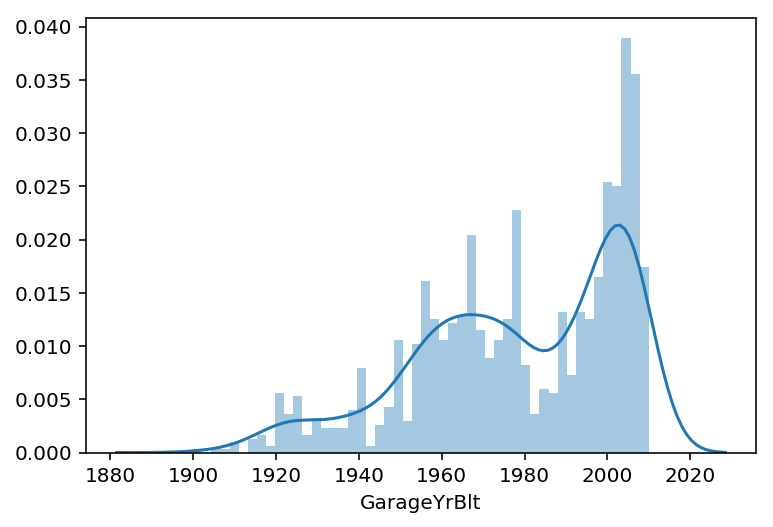

In [13]:
sns.distplot(df.GarageYrBlt.dropna(), bins=50);

Distribution appears to be negatively skewed. We hypothesize that the Year in which the garage was built is likely to be highly correlated to the Year that the house was built or the year that the remodelling was added. 

In [14]:
df.YearBuilt.corr(df.GarageYrBlt)

0.8256674841743421

In [15]:
df.YearRemodAdd.corr(df.GarageYrBlt)

0.6422767797035385

As there is a high correlation between the Year that the house was built and the year that the garage was built, we will be dropping the variable GarageYrBlt as most of the information is already captured in the Year it was built.

In [16]:
df.drop('GarageYrBlt', axis=1, inplace=True)

In [17]:
# Double checking our changes 
missing_pct(df)

The following variables have missing data and the percentage of total missing are as follows:
FireplaceQu     47.260274
LotFrontage     17.739726
BsmtFinType2     2.602740
BsmtExposure     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64


#### Handling Missing Data: BsmtFinType2, BsmtExposure, BsmtFinType1, BsmtCond, BsmtQual
Upon checking the data description for each of these variables, the missing data for these variables are due to the house not having a basement. Therefore, we will replace the missing values with a new category type of 'NoBsmt'.

In [18]:
basement_details = ['BsmtFinType2', 'BsmtExposure', 'BsmtFinType1', 'BsmtCond', 'BsmtQual']

In [19]:
df[basement_details] = df[basement_details].fillna('NoBsmt')

In [20]:
# Double checking our changes
missing_pct(df)

The following variables have missing data and the percentage of total missing are as follows:
FireplaceQu    47.260274
LotFrontage    17.739726
MasVnrType      0.547945
MasVnrArea      0.547945
Electrical      0.068493
dtype: float64


#### Handling Missing Data: MasVnrType, MasVnrArea
* MasVnrType: Masonry veneer type
* MasVnrArea: Masonry veneer area in square feet
* Electrical: Electrical System

As the number of missing data for these variables are low, we will just be dropping the observations that have missing data for these variables.

In [21]:
df = df.dropna(how='any', subset=['MasVnrType', 'MasVnrArea', 'Electrical'])

In [22]:
# Double checking our changes
missing_pct(df)

The following variables have missing data and the percentage of total missing are as follows:
FireplaceQu    47.208822
LotFrontage    17.711923
dtype: float64


#### Handling Missing Data: LotFrontage
* Linear feet of street connected to property

We will be using K-Nearest Neighbours algorithm to impute the missing data for the LotFrontage variable.

In [23]:
df.LotFrontage.describe()

count    1194.000000
mean       70.027638
std        24.299302
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [24]:
from missingpy import KNNImputer
imputer = KNNImputer(n_neighbors=5,
                     weights='distance',
                     metric='masked_euclidean')

df.LotFrontage = imputer.fit_transform(np.array(df.drop('FireplaceQu', axis=1).LotFrontage).reshape(-1,1))

In [25]:
df.LotFrontage.describe()

count    1451.000000
mean       70.027638
std        22.040935
min        21.000000
25%        60.000000
50%        70.027638
75%        79.000000
max       313.000000
Name: LotFrontage, dtype: float64

#### Handling Missing Data: FireplaceQu
* FireplaceQu - Quality of the Fireplace

Upon checking the data description, the missing values for this variable are due to the house not having a fireplace. Therefore, we will impute the missing elements as 'NoFireplc'.

In [26]:
df.FireplaceQu = df.FireplaceQu.fillna('NoFireplc')

In [27]:
# Final check for missing data
missing_pct(df)

The dataframe has no missing values in any column.


#### Checking and Converting Variable Types

In [28]:
# Checking Variable Types
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1451 entries, 0 to 1459
Data columns (total 75 columns):
MSSubClass       1451 non-null int64
MSZoning         1451 non-null object
LotFrontage      1451 non-null float64
LotArea          1451 non-null int64
Street           1451 non-null object
LotShape         1451 non-null object
LandContour      1451 non-null object
Utilities        1451 non-null object
LotConfig        1451 non-null object
LandSlope        1451 non-null object
Neighborhood     1451 non-null object
Condition1       1451 non-null object
Condition2       1451 non-null object
BldgType         1451 non-null object
HouseStyle       1451 non-null object
OverallQual      1451 non-null int64
OverallCond      1451 non-null int64
YearBuilt        1451 non-null int64
YearRemodAdd     1451 non-null int64
RoofStyle        1451 non-null object
RoofMatl         1451 non-null object
Exterior1st      1451 non-null object
Exterior2nd      1451 non-null object
MasVnrType       1451 no

Some variables appear to be categorical but are stored numerically, therefore we need to convert them back to categorical variables.

In [29]:
df = df.replace({'MSSubClass' : {20 : "SC20", 30 : "SC30", 40 : "SC40", 45 : "SC45", 
                                 50 : "SC50", 60 : "SC60", 70 : "SC70", 75 : "SC75", 
                                 80 : "SC80", 85 : "SC85", 90 : "SC90", 120 : "SC120", 
                                 150 : "SC150", 160 : "SC160", 180 : "SC180", 190 : "SC190"},
                 'MoSold' : {1 : "Jan", 2 : "Feb", 3 : "Mar", 4 : "Apr", 5 : "May", 6 : "Jun",
                            7 : "Jul", 8 : "Aug", 9 : "Sep", 10 : "Oct", 11 : "Nov", 12 : "Dec"}
                })

Coverting categerical variables to an interval scale as they are ordinal in nature.

In [30]:
df = df.replace({'ExterQual' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'ExterCond' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'BsmtQual' : {'NoBsmt' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'BsmtCond' : {'NoBsmt' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'BsmtExposure' : {'NoBsmt' : 0, 'No' : 1, 'Mn' : 2, 'Av' : 3, 'Gd' : 4},
                 'BsmtFinType1' : {'NoBsmt' : 0, 'Unf' : 1, 'LwQ' : 2, 'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6},
                 'BsmtFinType2' : {'NoBsmt' : 0, 'Unf' : 1, 'LwQ' : 2, 'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6},
                 'HeatingQC' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'CentralAir' : {'N' : 0, 'Y' : 1},
                 'KitchenQual' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'FireplaceQu' : {'NoFireplc' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'GarageFinish' : {'NoGarage' : 0, 'Unf' : 1, 'RFn' : 2, 'Fin' : 3},
                 'GarageQual' : {'NoGarage' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'GarageCond' : {'NoGarage' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
                 'PavedDrive' : {'N' : 0, 'P' : 0.5, 'Y' : 1},
                 
                })

In [31]:
# Checking our datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1451 entries, 0 to 1459
Data columns (total 75 columns):
MSSubClass       1451 non-null object
MSZoning         1451 non-null object
LotFrontage      1451 non-null float64
LotArea          1451 non-null int64
Street           1451 non-null object
LotShape         1451 non-null object
LandContour      1451 non-null object
Utilities        1451 non-null object
LotConfig        1451 non-null object
LandSlope        1451 non-null object
Neighborhood     1451 non-null object
Condition1       1451 non-null object
Condition2       1451 non-null object
BldgType         1451 non-null object
HouseStyle       1451 non-null object
OverallQual      1451 non-null int64
OverallCond      1451 non-null int64
YearBuilt        1451 non-null int64
YearRemodAdd     1451 non-null int64
RoofStyle        1451 non-null object
RoofMatl         1451 non-null object
Exterior1st      1451 non-null object
Exterior2nd      1451 non-null object
MasVnrType       1451 n

In [32]:
# Changing features to their correct data types
df.BsmtCond = df.BsmtCond.astype('int64')
df.BsmtFinType2 = df.BsmtFinType2.astype('int64')
df.FireplaceQu = df.FireplaceQu.astype('int64')

### Feature Transformations for Continuous Data

Now that we have finished handling all the missing data in our dataset, we can move on to analysing our individual features and making any transformations if necessary.

In [33]:
def var_plots(series, target=True):
    '''
    Function that plots the distribution of the variable as well as its distribution against the Target LogSales=Price.
    
    :params:
        series : Feature column in the dataset.
        target : Set to true to plot variable against target variable LogSalePrice. Default is True.
    '''
    if target:
        f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(10,8))
        f.tight_layout(pad=5.0)
    
        ax1.set_title('Distribution for Variable: {}'.format(series.name), size=12)
        _, p_val = stats.normaltest(series)
        anchored_text = AnchoredText('Skew = {:.2f}\nKurtosis = {:.2f}\nP-val = {:.4f}'.format(stats.skew(series),
                                                                                               stats.kurtosis(series),
                                                                                               p_val), loc='center right', frameon=False)
        ax1.add_artist(anchored_text)
        
        sns.distplot(series, bins=100, ax=ax1)

        stats.probplot(series, plot=ax2)
        
        sns.boxplot(series, ax=ax3)
        ax3.set_title('Boxplot for {}'.format(series.name), size=12, y=1.05)
        
        sns.scatterplot(x=series, y=df.LogSalePrice, alpha=0.5, ax=ax4)
        correlation = series.corr(df.LogSalePrice)
        ax4.set_title('Correlation = {:.2f}'.format(correlation), size=12, y=1.05)
    
    else:
        f, (ax1, ax2) = plt.subplots(1,2,figsize=(10,4))
        f.tight_layout(pad=5.0)
    
        ax1.set_title('Distribution for Variable: {}'.format(series.name), size=12)
        _, p_val = stats.normaltest(series)
        anchored_text = AnchoredText('Skew = {:.2f}\nKurtosis = {:.2f}\nP-val = {:.4f}'.format(stats.skew(series),
                                                                                               stats.kurtosis(series),
                                                                                               p_val), loc='center right', frameon=False)
        ax1.add_artist(anchored_text)
        sns.distplot(series, bins=100, ax=ax1)

        stats.probplot(series, plot=ax2)
    sns.despine();

#### Target Variable: SalePrice

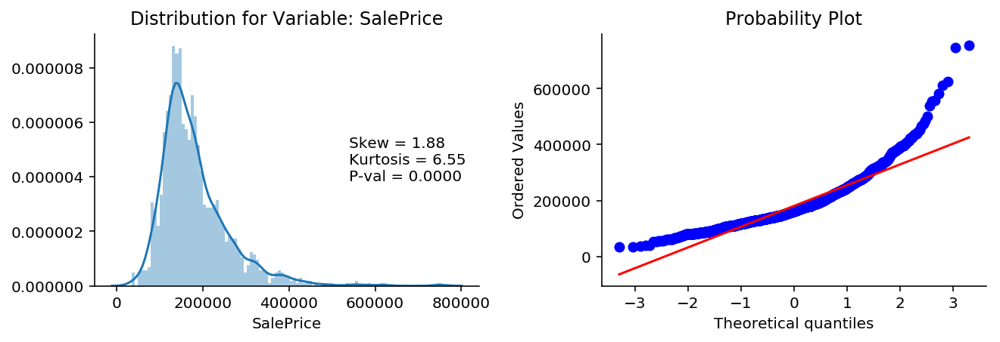

In [34]:
var_plots(df.SalePrice, target=False)

We can see that the target variable has a positive skew. Therefore, we will attempt a log transformation on SalePrice.

In [35]:
df['LogSalePrice'] = np.log1p(df.SalePrice)

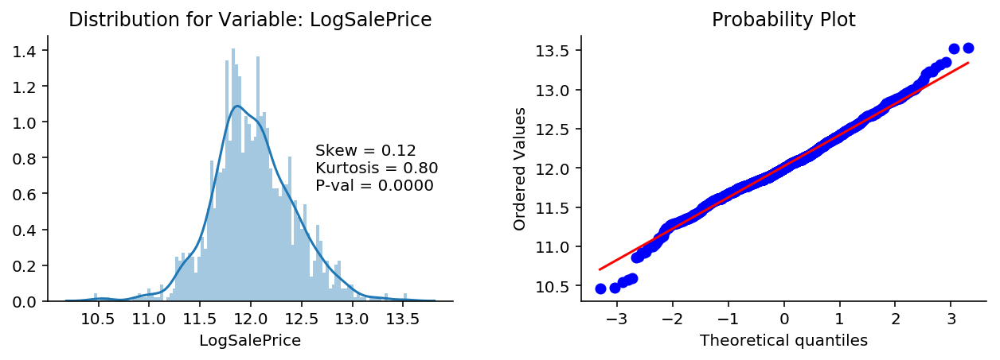

In [36]:
var_plots(df.LogSalePrice, target=False)

After the log transformation, the variable is more normally distributed. Therefore, we will use the log transformed version as the target and delete the original variable.

In [37]:
df = df.drop('SalePrice', axis=1)

#### Feature: LotFrontage

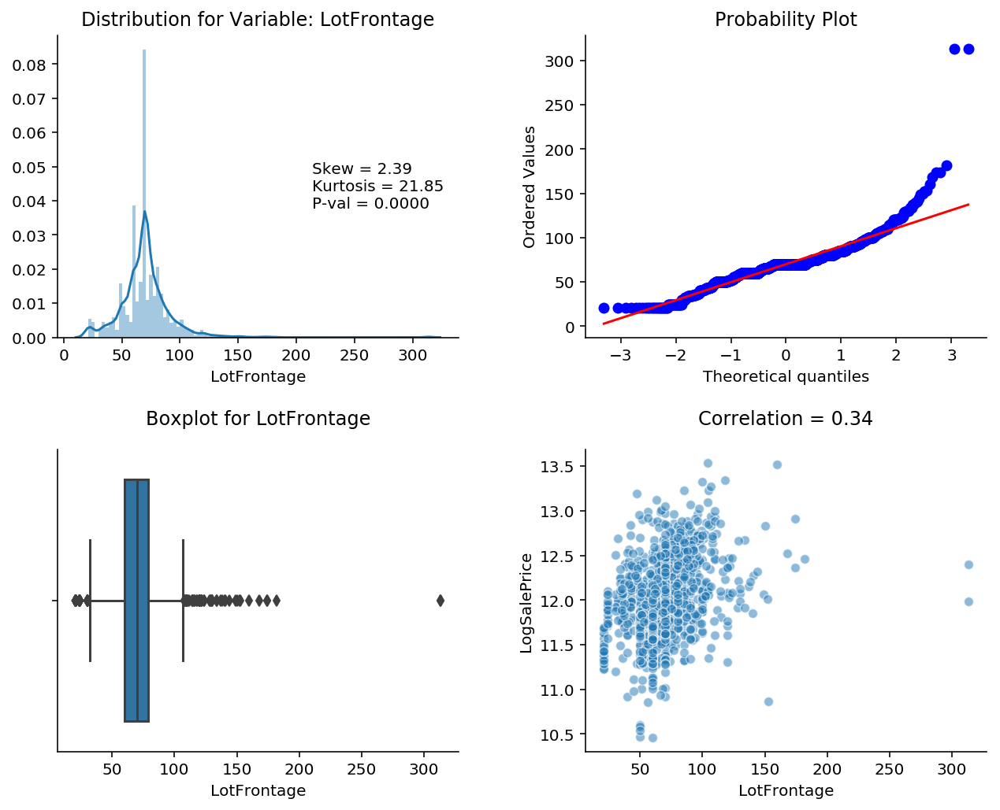

In [38]:
var_plots(df.LotFrontage)

The data for LotFrontage is positively skewed, therefore we will apply a logarithmic transformation as well.

In [39]:
df['LogLotFrontage'] = np.log1p(df.LotFrontage)

df = df.drop('LotFrontage', axis=1)

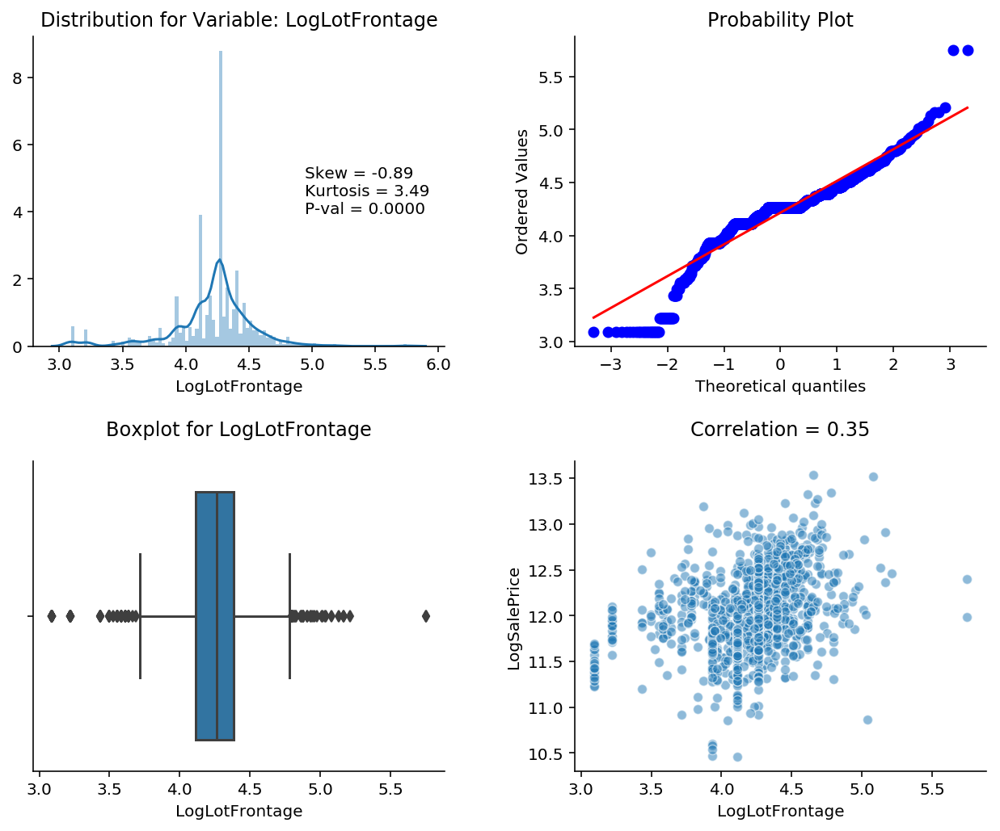

In [40]:
var_plots(df.LogLotFrontage)

#### Feature: LotArea

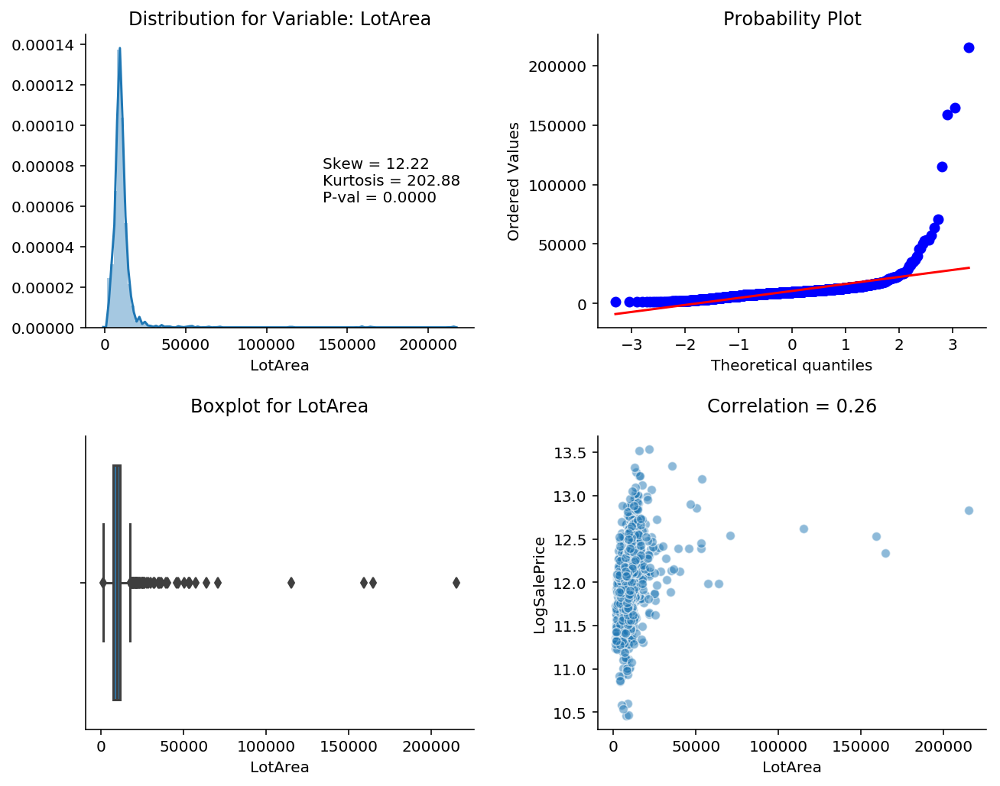

In [41]:
var_plots(df.LotArea)

We can see that the feature LotArea is highly skewed, therefore, we will apply a logarithm transformation.

In [42]:
df['LogLotArea'] = np.log1p(df.LotArea)
df = df.drop('LotArea', axis=1)

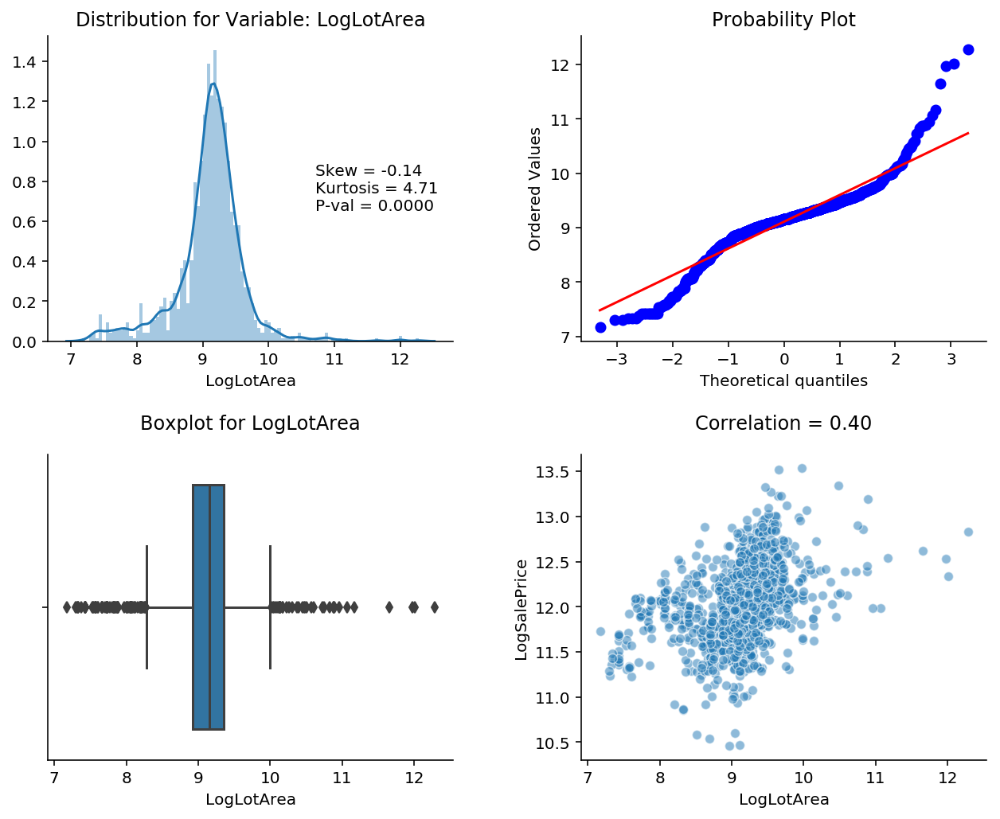

In [43]:
var_plots(df.LogLotArea)

#### Feature: YearBuilt

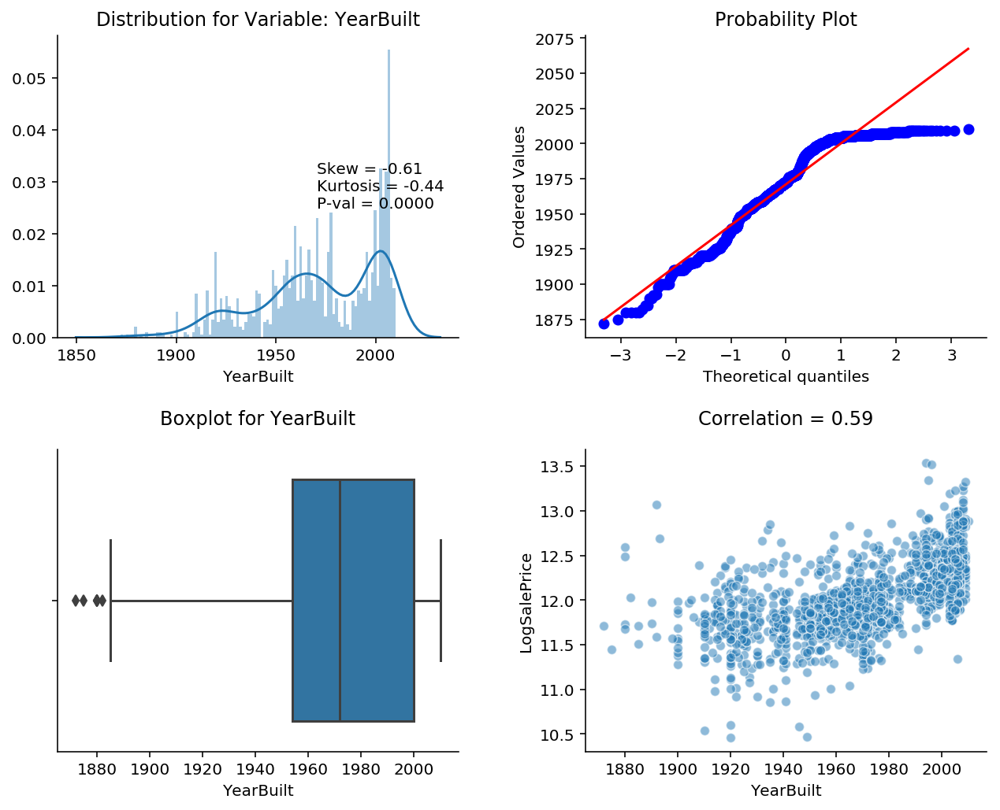

In [44]:
var_plots(df.YearBuilt)

#### Feature: YearRemodAdd

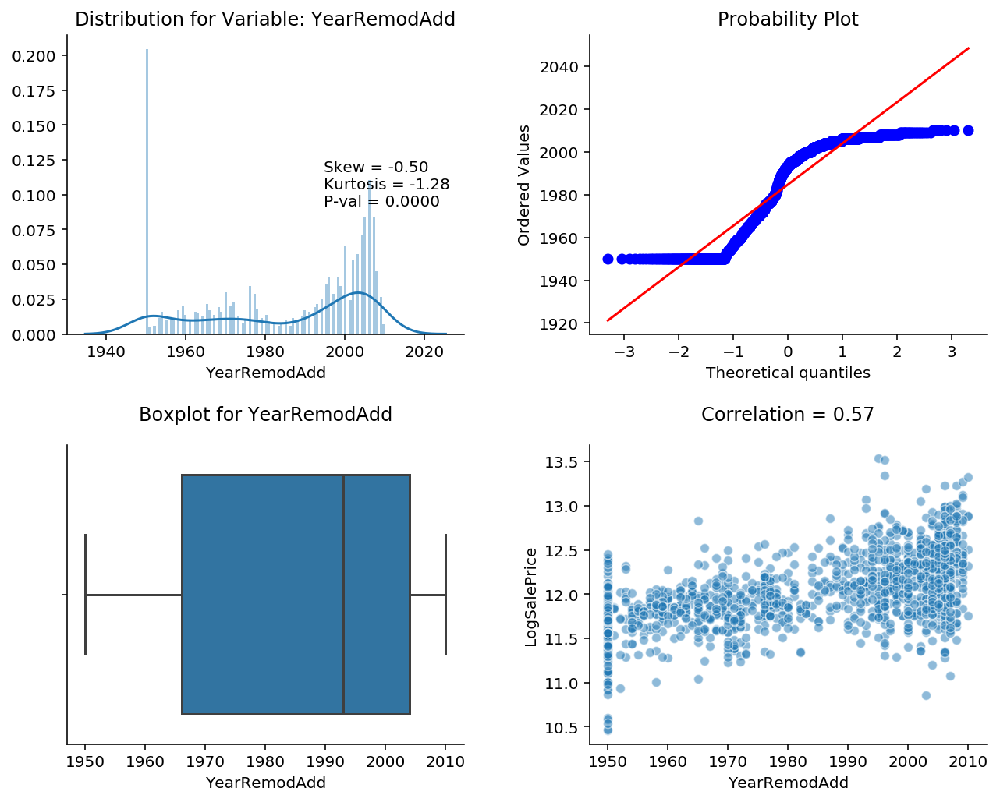

In [45]:
var_plots(df.YearRemodAdd)

In [155]:
# Binning the data
df.YearRemodAdd = pd.cut(df.YearRemodAdd,
                         [1950, 1970, 1990, df.YearRemodAdd.nlargest(n=1)],
                         labels=['VeryOldRemod', 'OldRemod', 'RecentRemod'],
                         include_lowest=True)

#### Feature: MasVnrArea

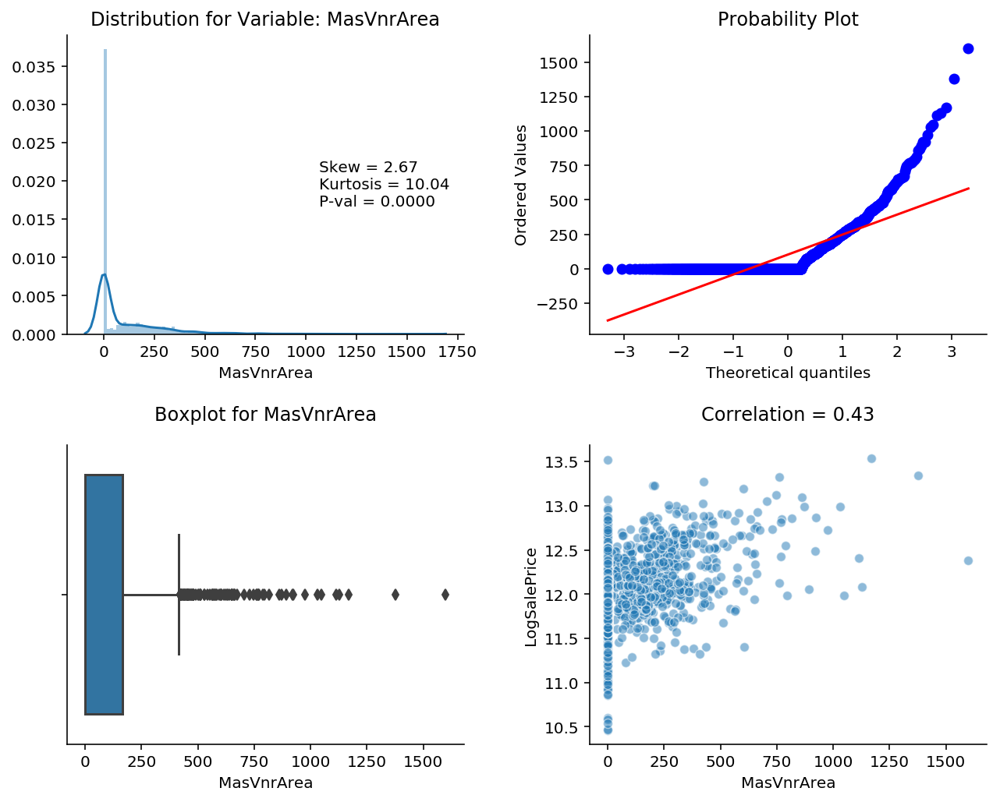

In [46]:
var_plots(df.MasVnrArea)

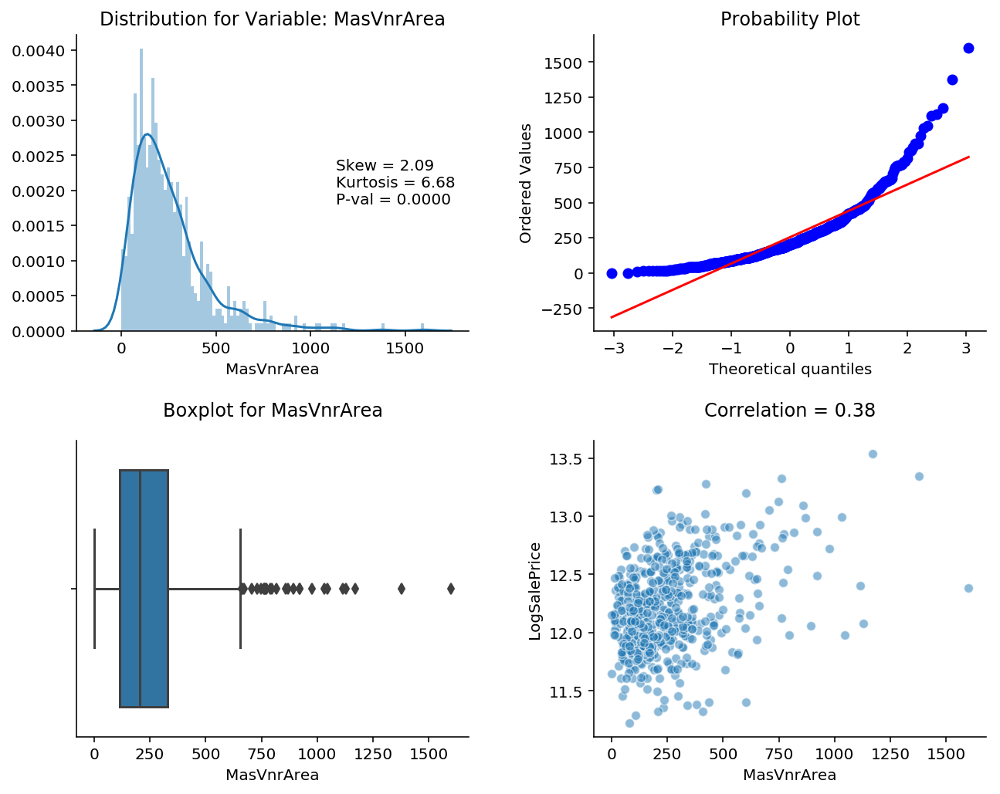

In [47]:
var_plots(df.MasVnrArea.loc[df.MasVnrArea > 0])

In [48]:
# Percentage of data with non-zero entries
df.MasVnrArea.loc[df.MasVnrArea > 0].count() / len(df)

0.4073053066850448

In [49]:
# Binning our variable into categories
df.MasVnrArea = pd.cut(df.MasVnrArea,
                       [-1, 0, 500, 1000, df.MasVnrArea.nlargest(n=1)],
                       labels=['NoVnr', 'VnrArea_Small', 'VnrArea_Medium', 'VnrArea_Large'])

#### Feature: BsmtFinSF2

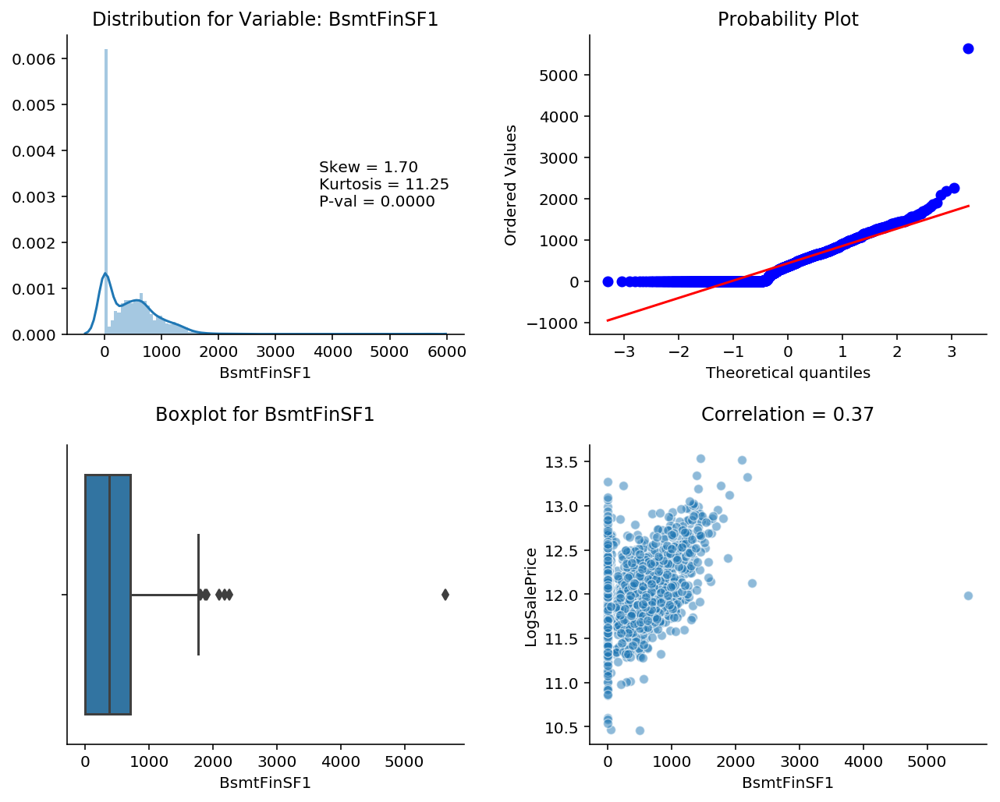

In [50]:
var_plots(df.BsmtFinSF1)

In [51]:
# Percentage of non-zero data
df.BsmtFinSF1.loc[df.BsmtFinSF1 > 0].count() / len(df)

0.6802205375603032

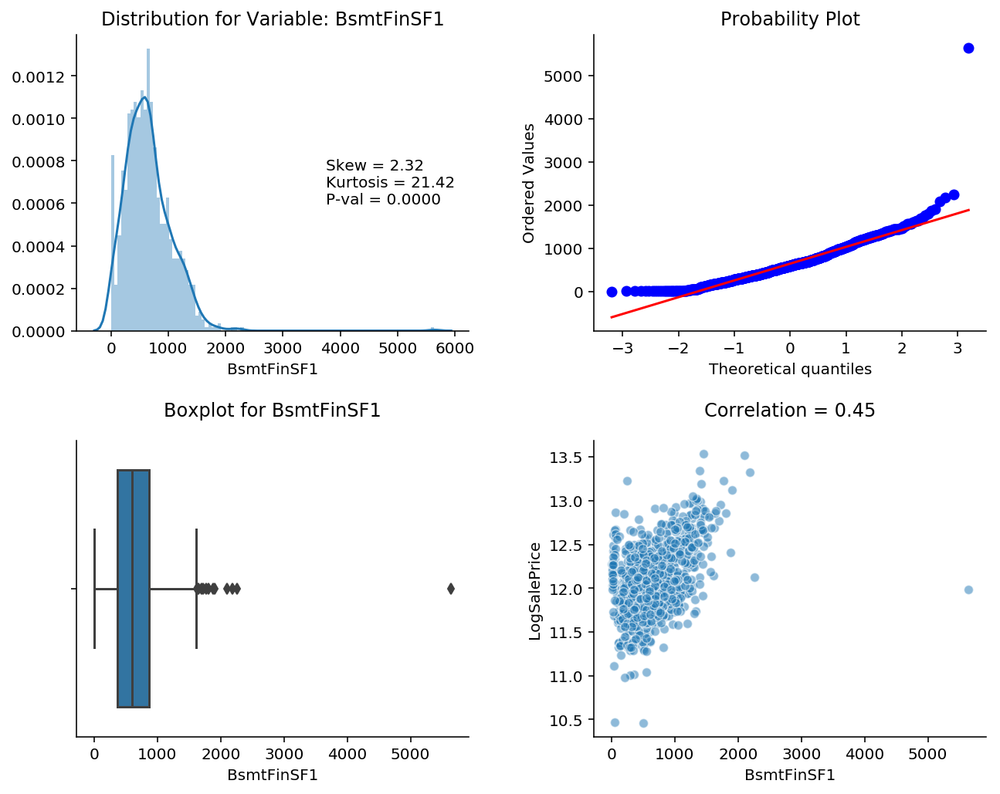

In [52]:
var_plots(df.BsmtFinSF1.loc[df.BsmtFinSF1 > 0])

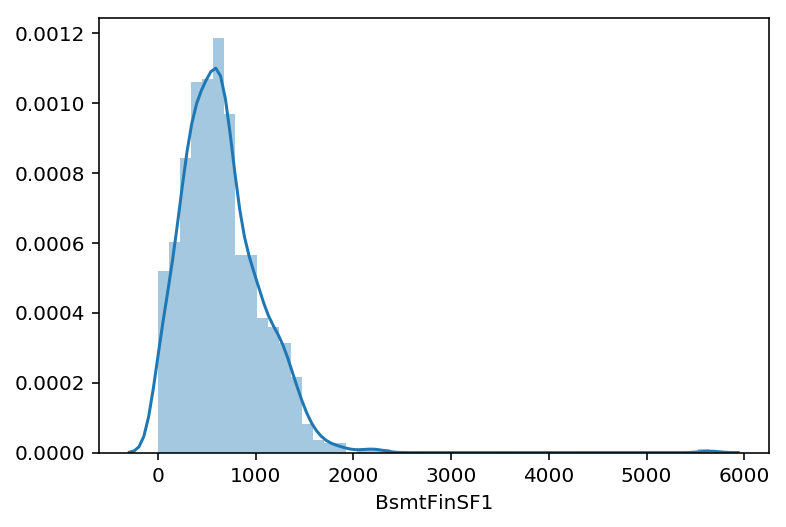

In [53]:
sns.distplot(df.BsmtFinSF1.loc[df.BsmtFinSF1 > 0], bins=50)

In [54]:
# Binning the variable into different categories
df.BsmtFinSF1 = pd.cut(df.BsmtFinSF1,
                       [-1, 0, 500, 1000, 1500, df.BsmtFinSF1.nlargest(n=1)],
                       labels=['NoBsmt', 'BsmtSF_Small', 'BsmtSF_Medium', 'BsmtSF_Large', 'BsmtSF_ExtraLarge'])

#### Feature : BsmtFinSF2

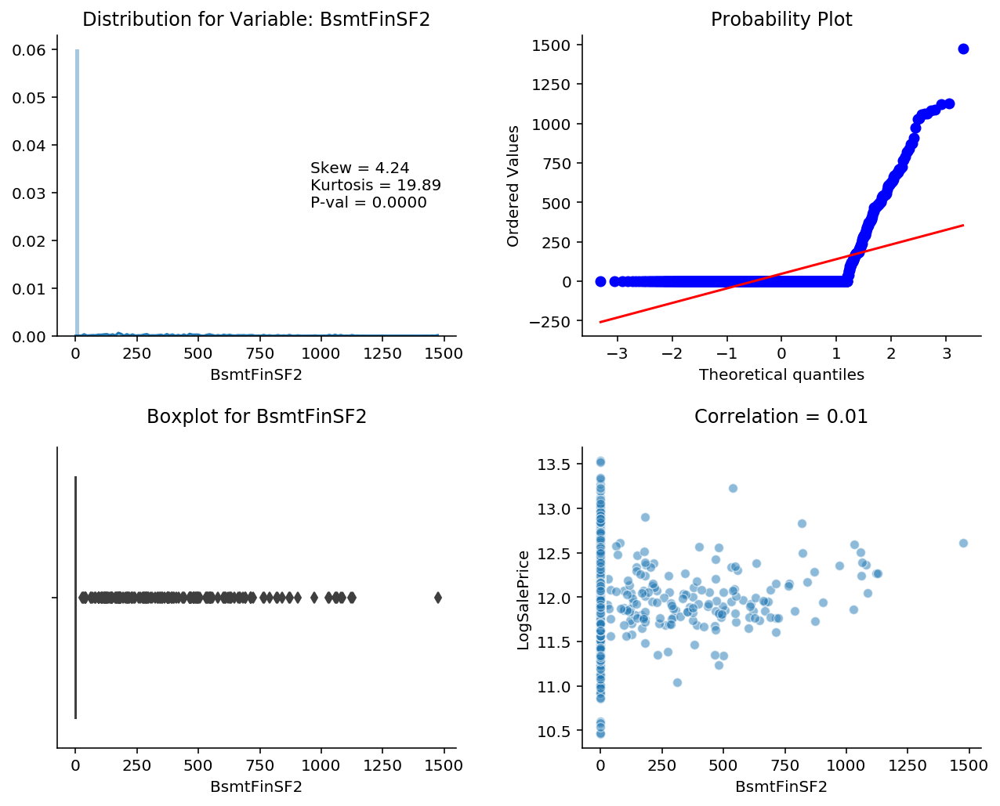

In [55]:
var_plots(df.BsmtFinSF2)

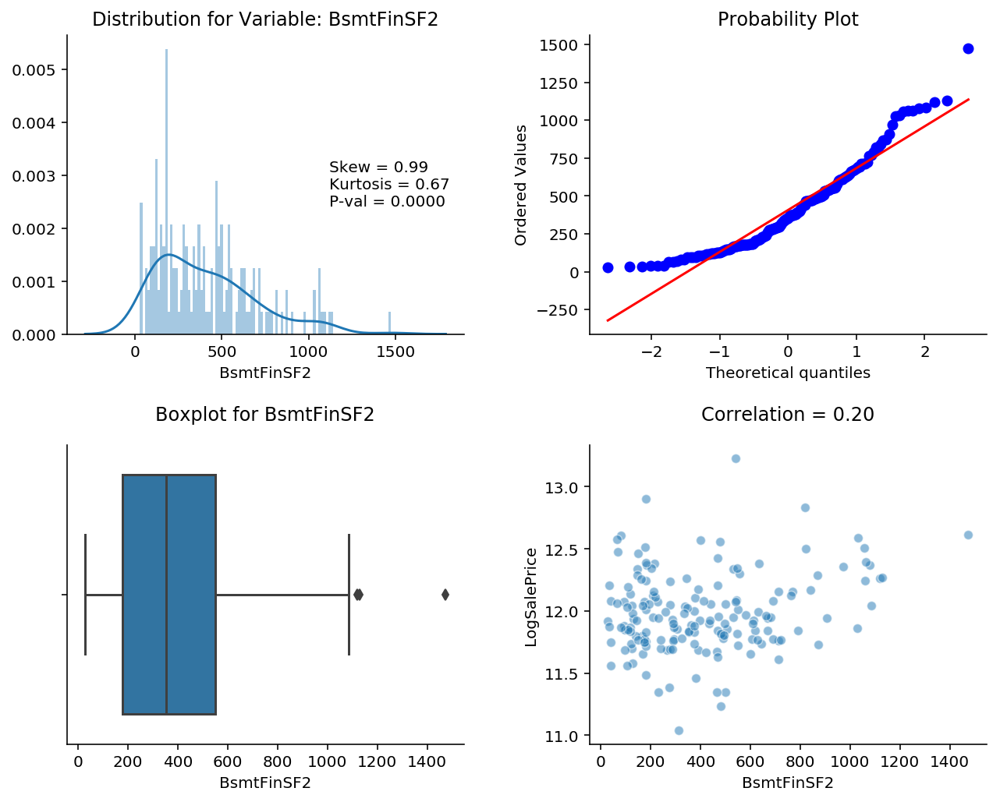

In [56]:
var_plots(df.BsmtFinSF2.loc[df.BsmtFinSF2 > 0])

In [57]:
# Dropping the variable as most observations are 0 and there is weak correlation for results > 0
df = df.drop('BsmtFinSF2', axis=1)

#### Feature : BsmtUnfSF

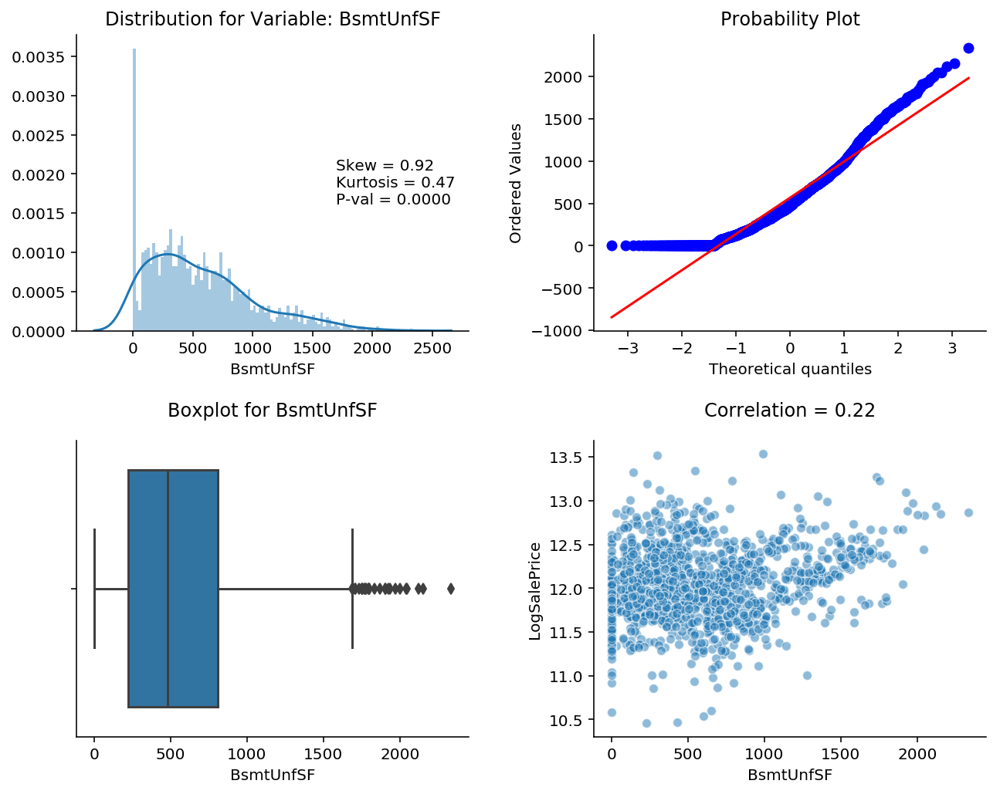

In [58]:
var_plots(df.BsmtUnfSF)

#### Feature : TotalBsmtSF

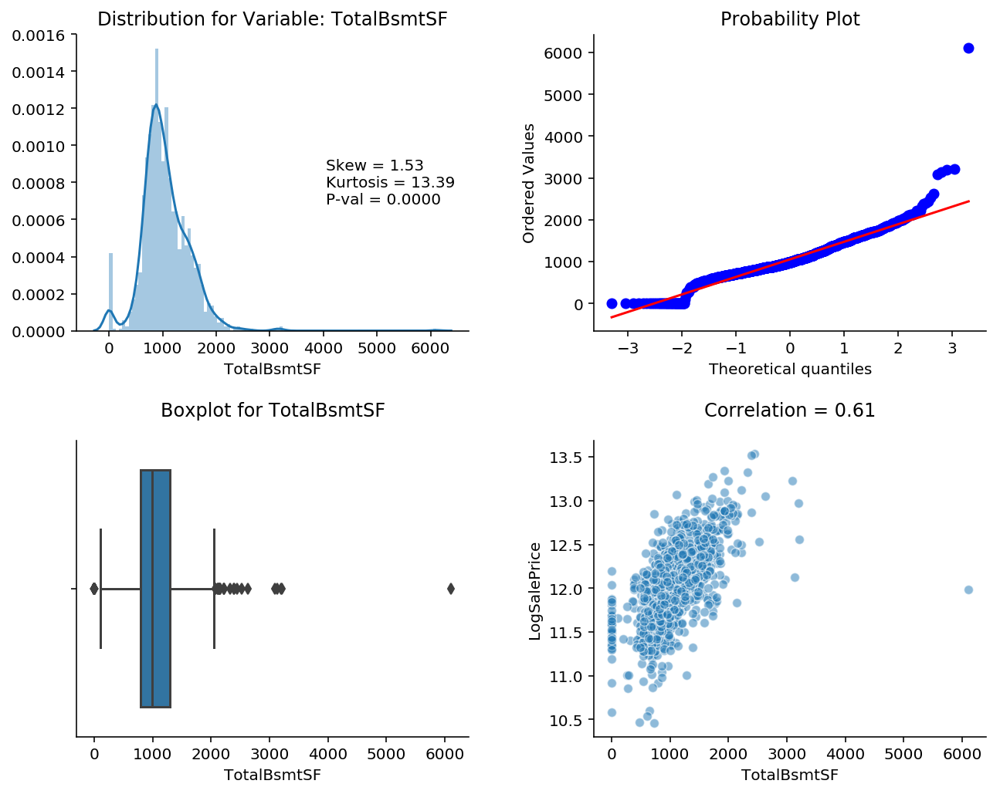

In [59]:
var_plots(df.TotalBsmtSF)

#### Feature : 1stFlrSF

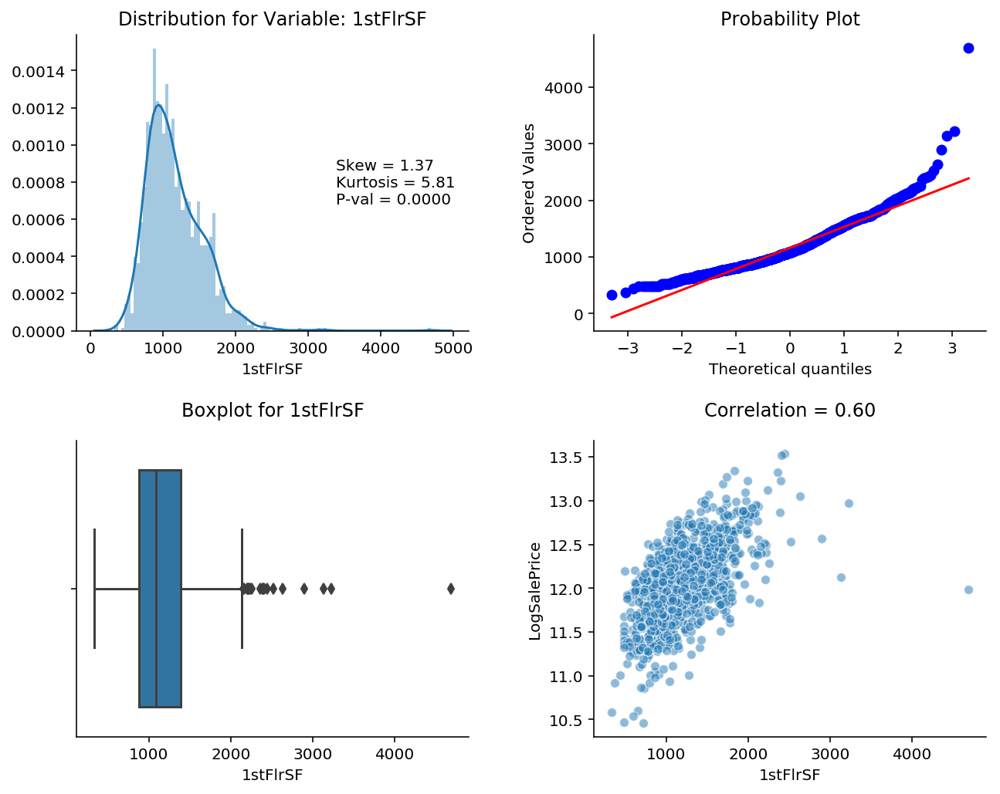

In [60]:
var_plots(df['1stFlrSF'])

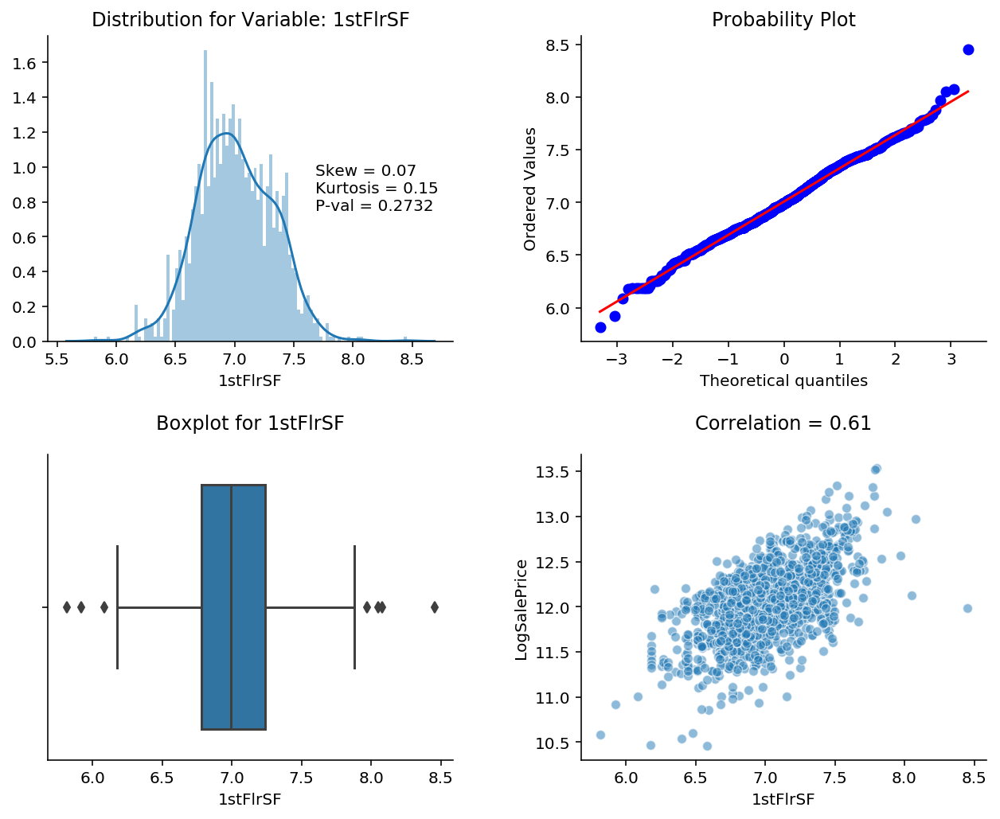

In [61]:
var_plots(np.log1p(df['1stFlrSF']))

The natural logarithm corrects the skew within the variable and has a slightly better correlation with the target.

In [62]:
df['LogFirstFlrSF'] = np.log1p(df['1stFlrSF'])

# Dropping original variable
df = df.drop('1stFlrSF', axis=1)

#### Feature : 2ndFlrSF

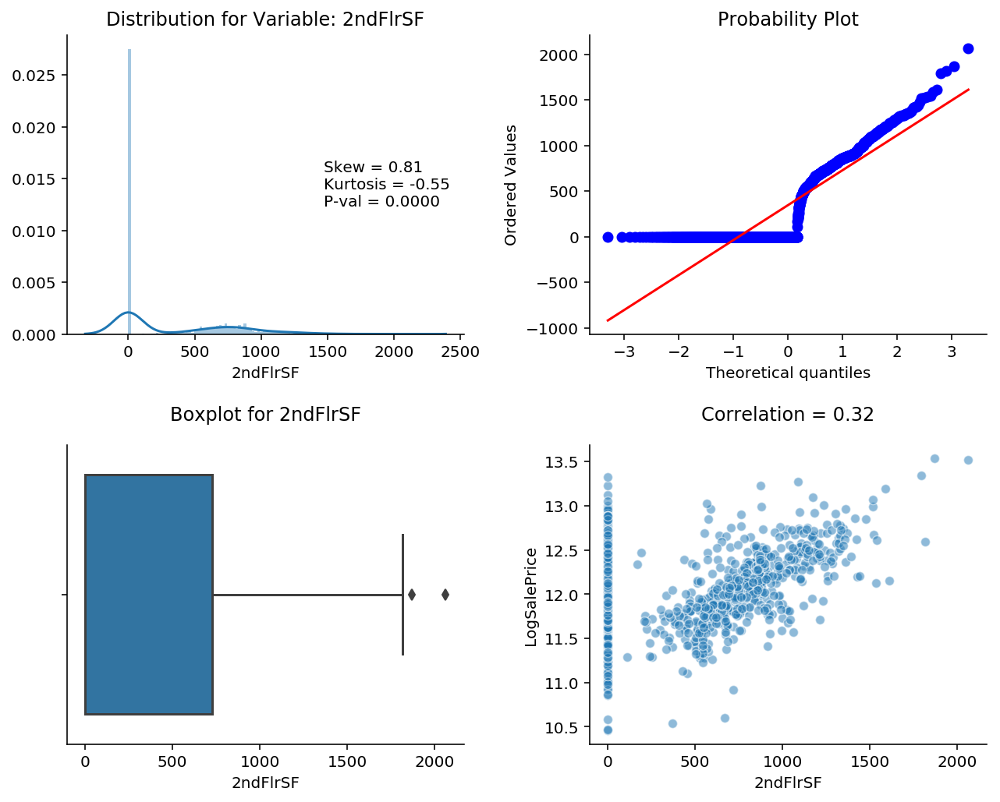

In [63]:
var_plots(df['2ndFlrSF'])

In [64]:
# Percentage of non-zero data
df['2ndFlrSF'].loc[df['2ndFlrSF'] > 0].count() / len(df)

0.4321157822191592

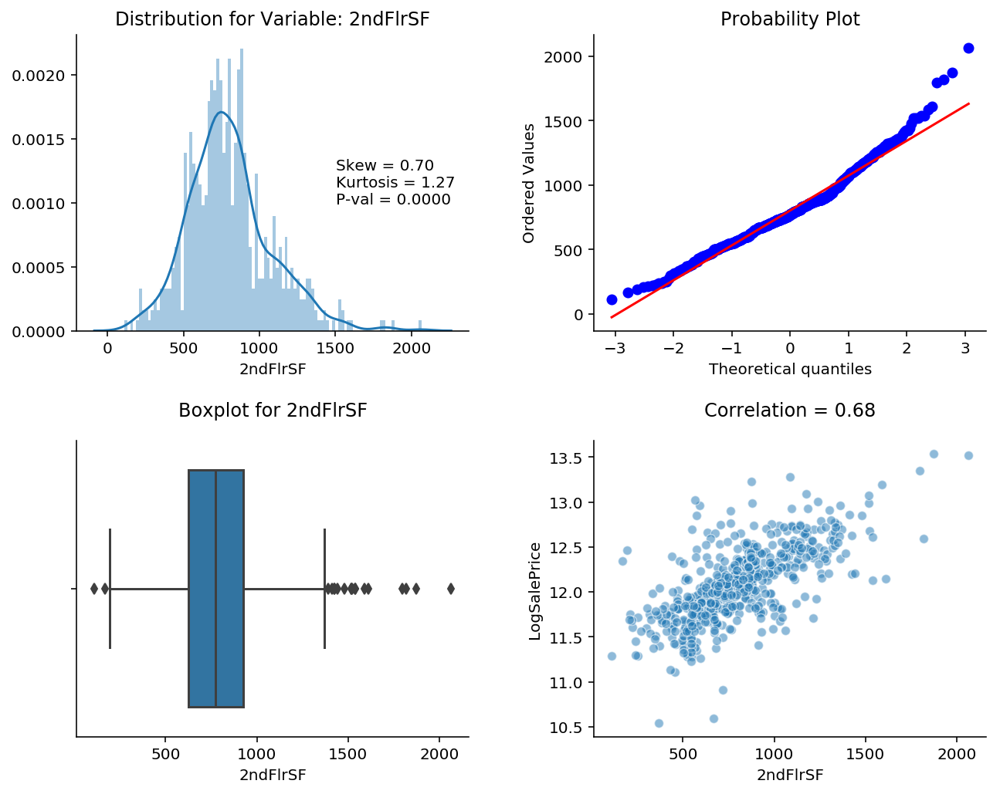

In [65]:
var_plots(df['2ndFlrSF'].loc[df['2ndFlrSF'] > 0])

In [152]:
# Binning the data with size 500
df['2ndFlrSF'] = pd.cut(df['2ndFlrSF'],
                        [-1, 0, 500, 1000, 1500, df['2ndFlrSF'].nlargest(n=1)],
                        labels=['NoSecondFlr', 'SecondFlr_Small', 'SecondFlr_Medium', 'SecondFlr_Large', 'SecondFlr_ExtraLarge'])

#### Feature : LowQualFinSF

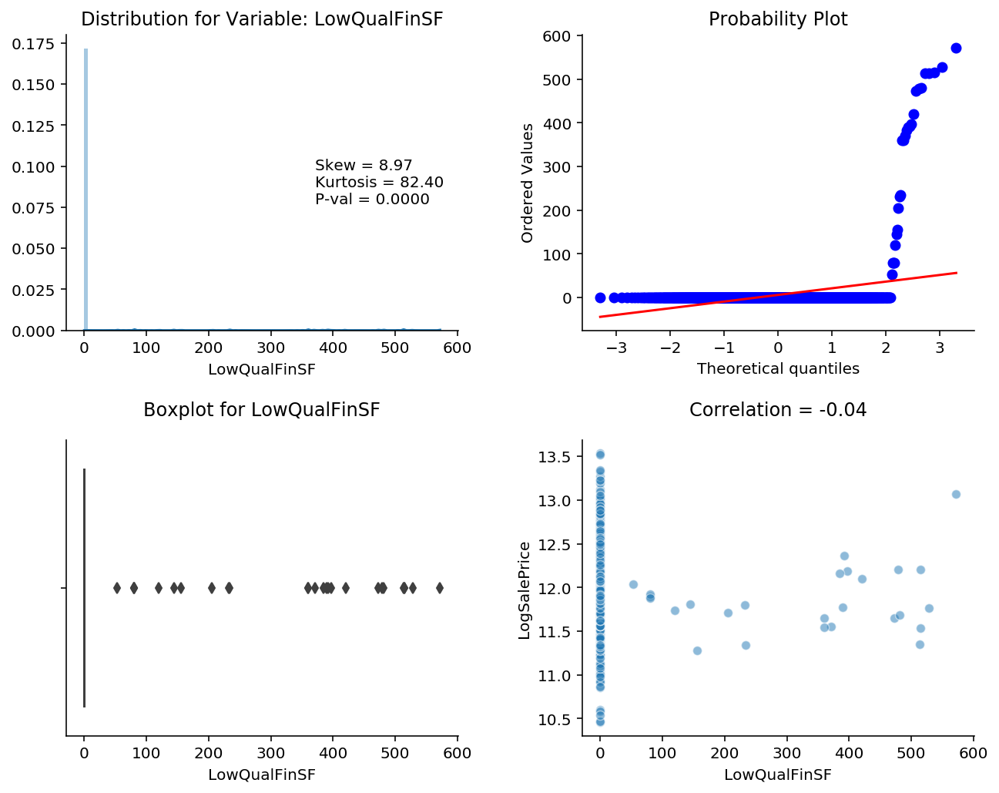

In [67]:
var_plots(df.LowQualFinSF)

In [68]:
# Dropping the variable as most values are 0
df = df.drop('LowQualFinSF', axis=1)

#### Feature : GrLivArea - Grounf floor living area

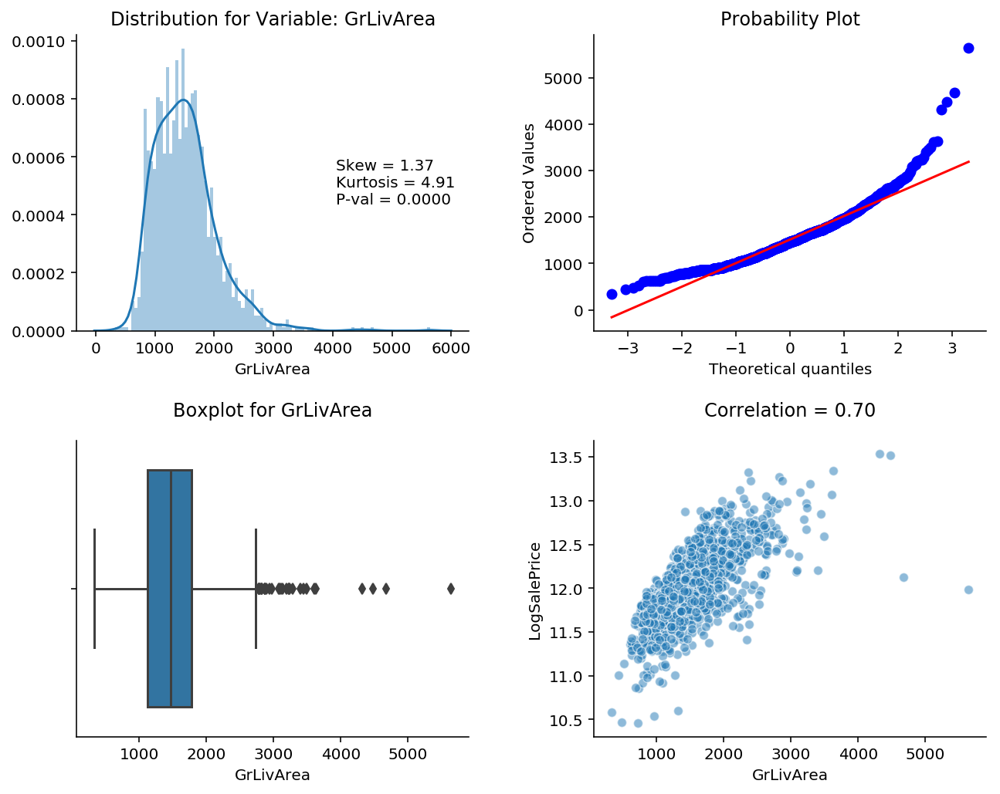

In [69]:
var_plots(df.GrLivArea)

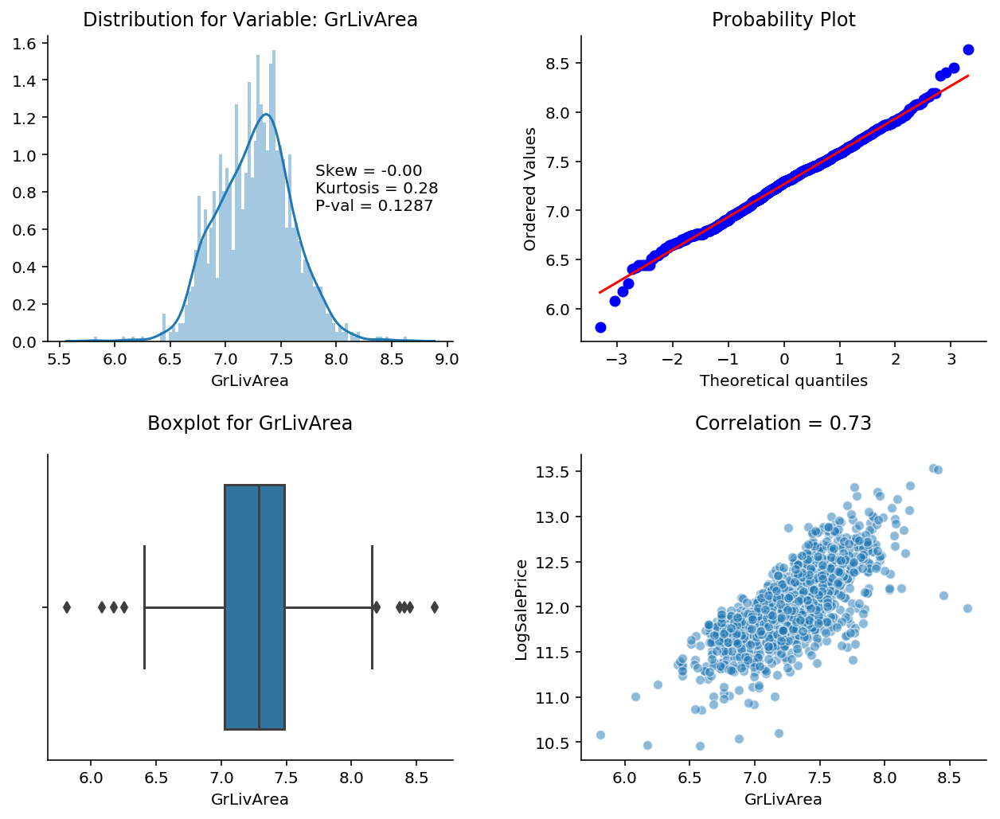

In [70]:
var_plots(np.log(df.GrLivArea))

In [71]:
df['LogGroundArea'] = np.log(df.GrLivArea)

# Dropping original variable
df = df.drop('GrLivArea', axis=1)

#### Feature : GarageArea

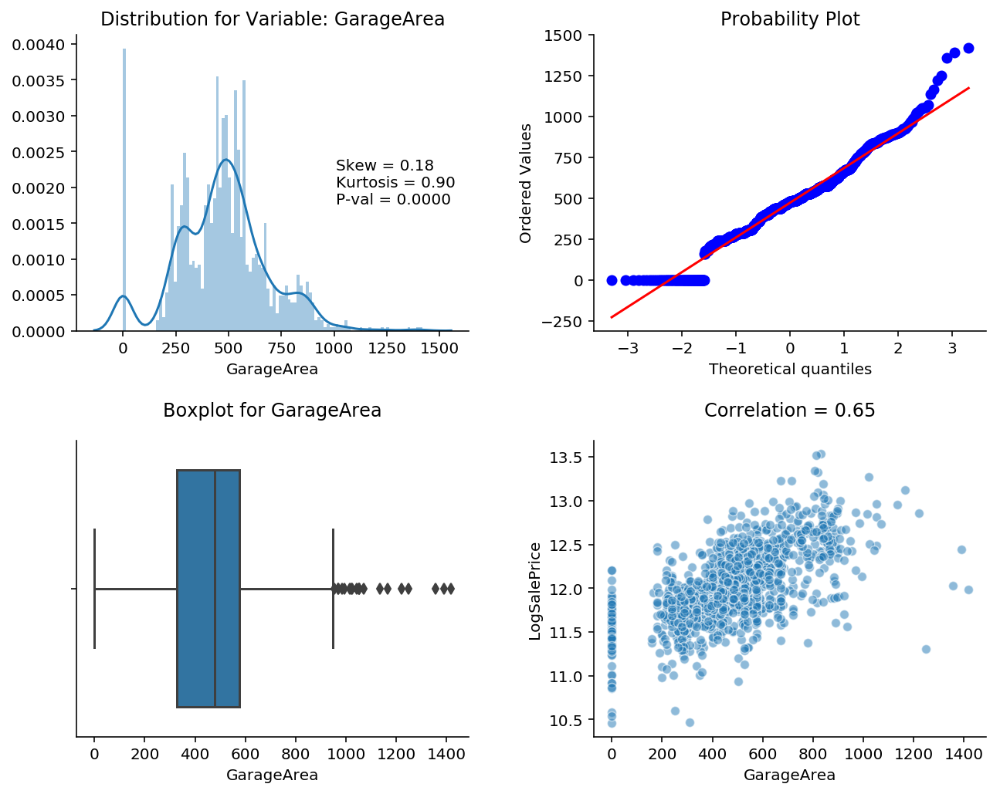

In [72]:
var_plots(df.GarageArea)

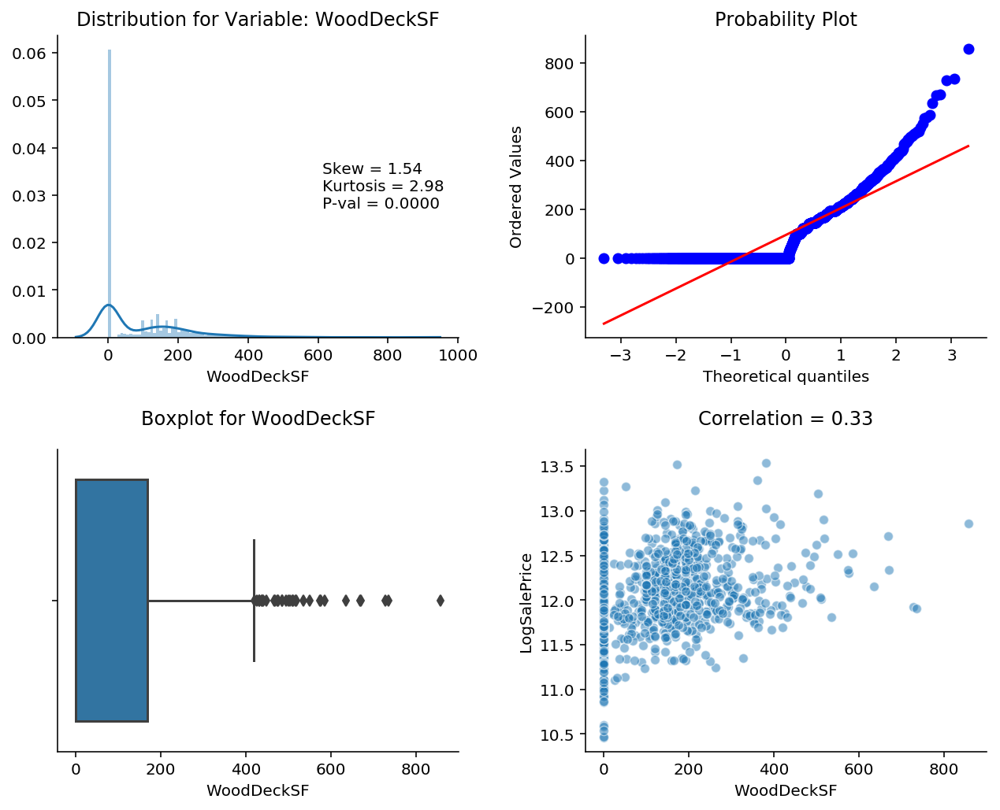

In [73]:
var_plots(df.WoodDeckSF)

In [74]:
# Percentage of total rows that have non-zero data
df.WoodDeckSF.loc[df.WoodDeckSF > 0].count() / len(df)

0.47966919365954513

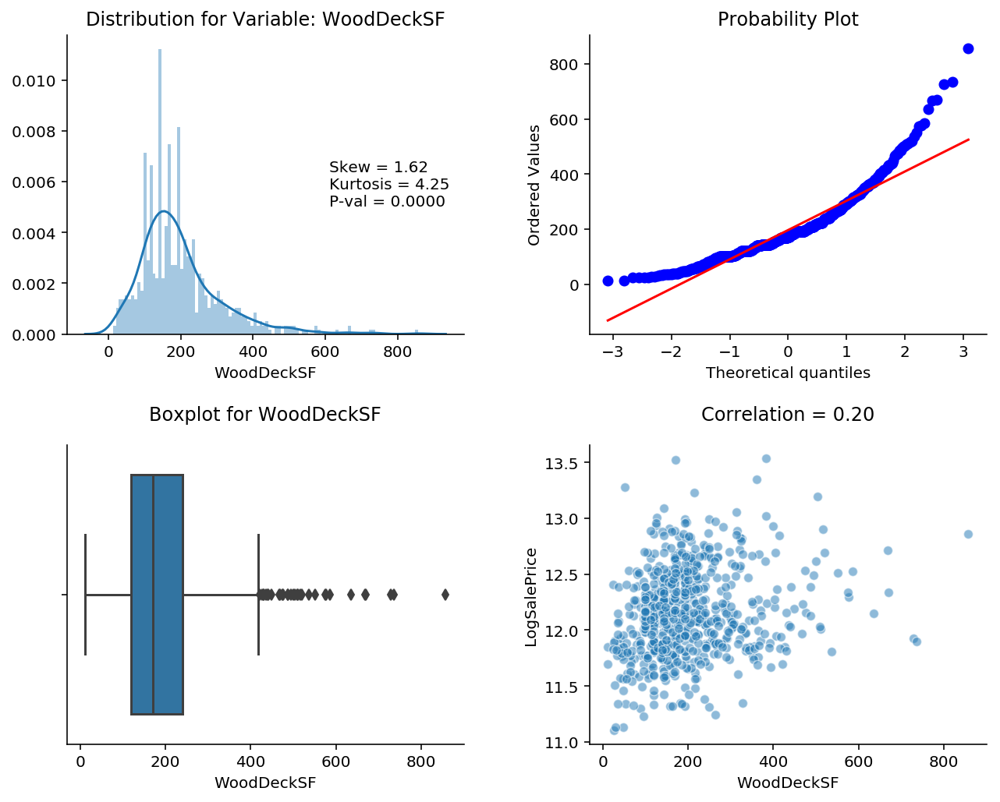

In [75]:
var_plots(df.WoodDeckSF.loc[df.WoodDeckSF > 0])

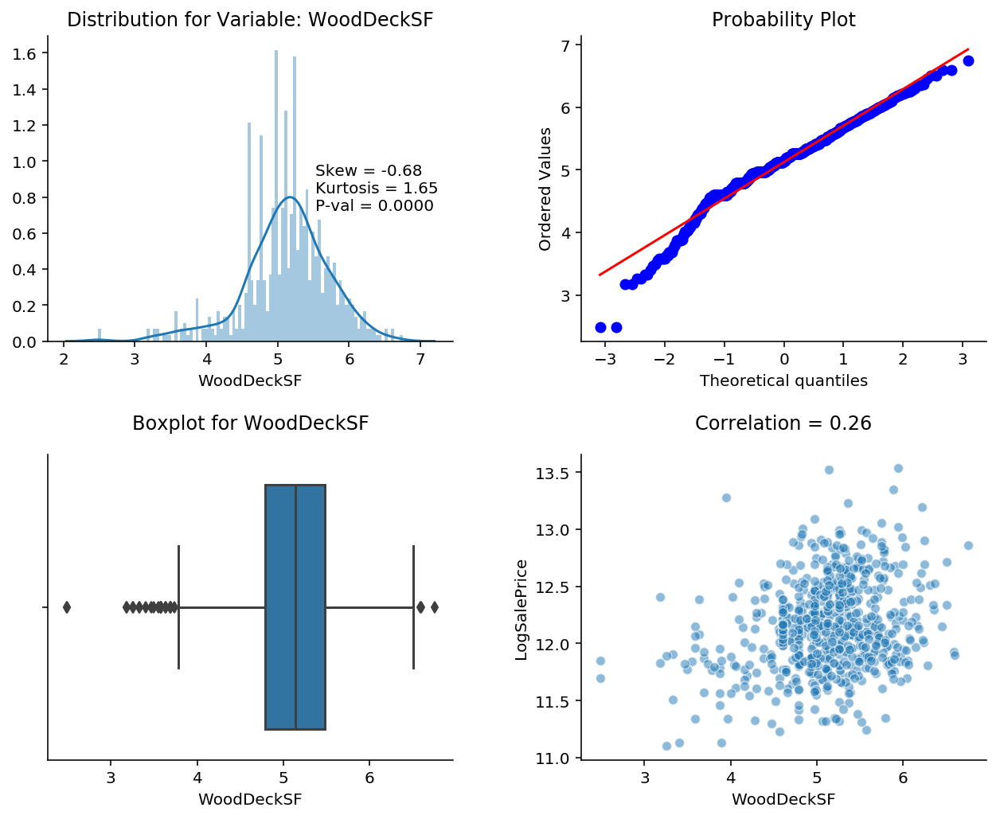

In [76]:
var_plots(np.log(df.WoodDeckSF.loc[df.WoodDeckSF > 0]))

#### Feature : OpenPorchSF

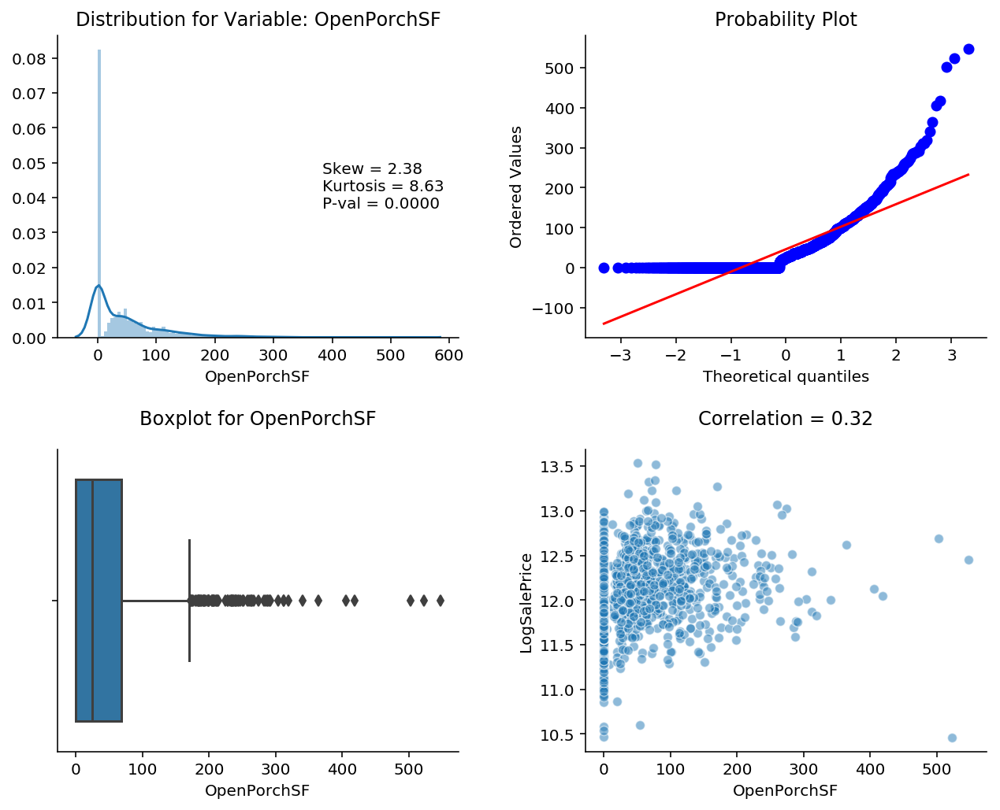

In [77]:
var_plots(df.OpenPorchSF)

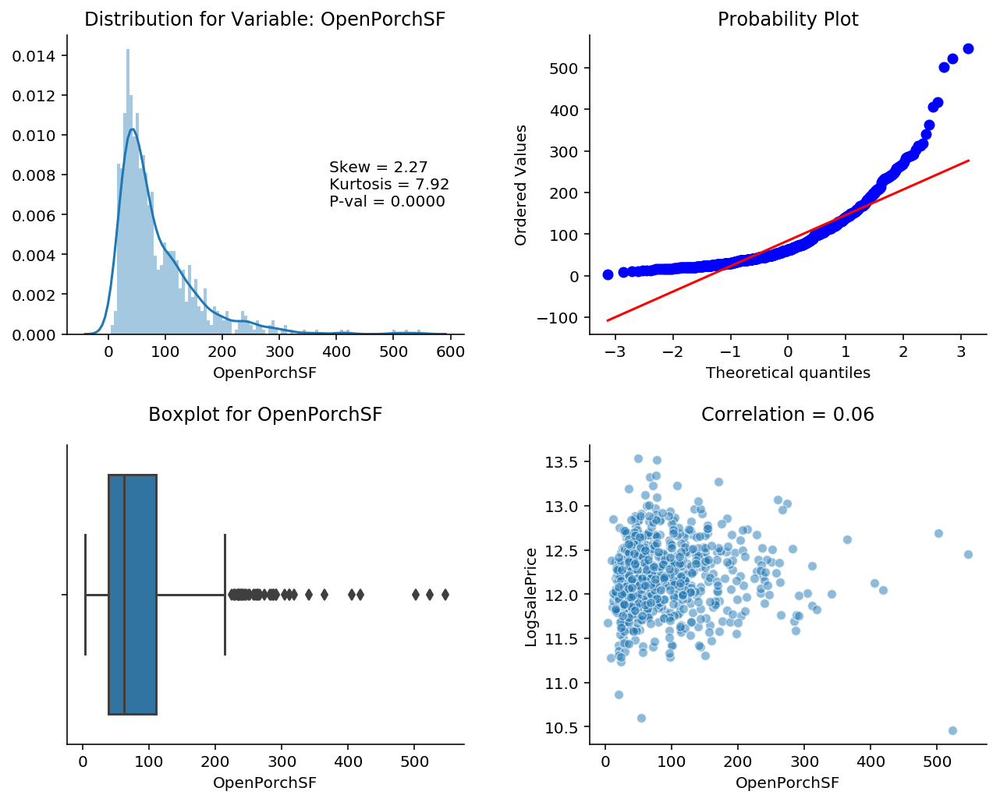

In [78]:
var_plots(df.OpenPorchSF.loc[df.OpenPorchSF > 0])

In [79]:
# Dropping the variable as it has low correlation with the target
df = df.drop('OpenPorchSF', axis=1)

#### Feature : EnclosedPorch

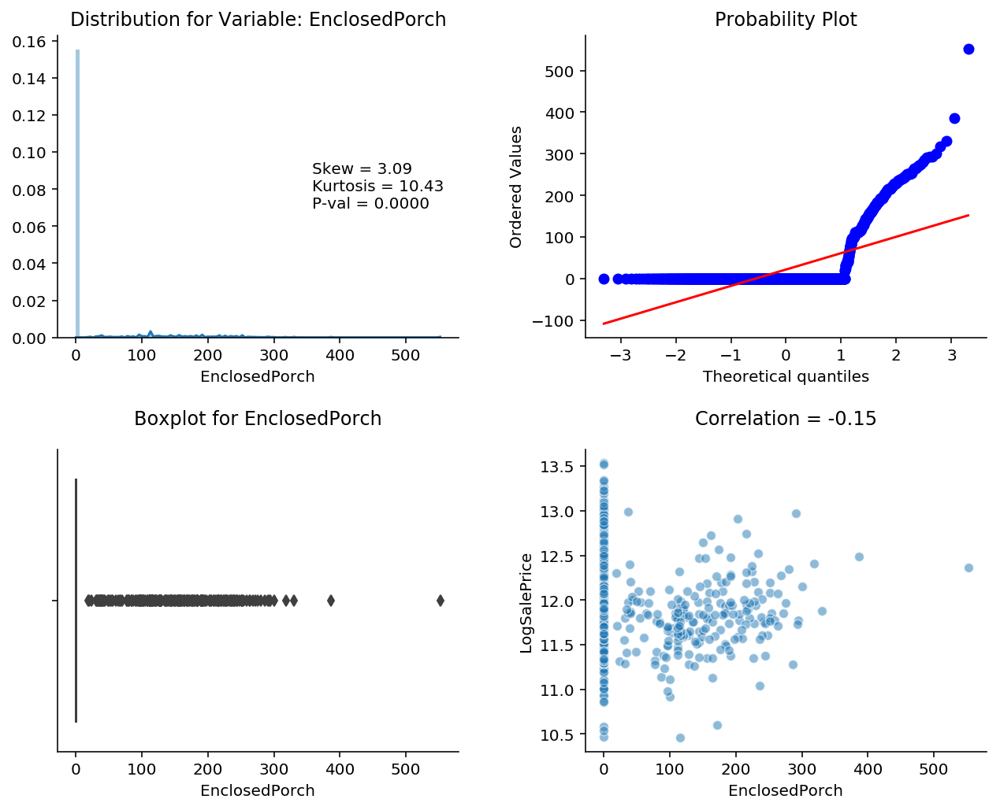

In [80]:
var_plots(df.EnclosedPorch)

In [81]:
# Dropping the variable as most values are 0
df = df.drop('EnclosedPorch', axis=1)

#### Feature : 3SsnPorch

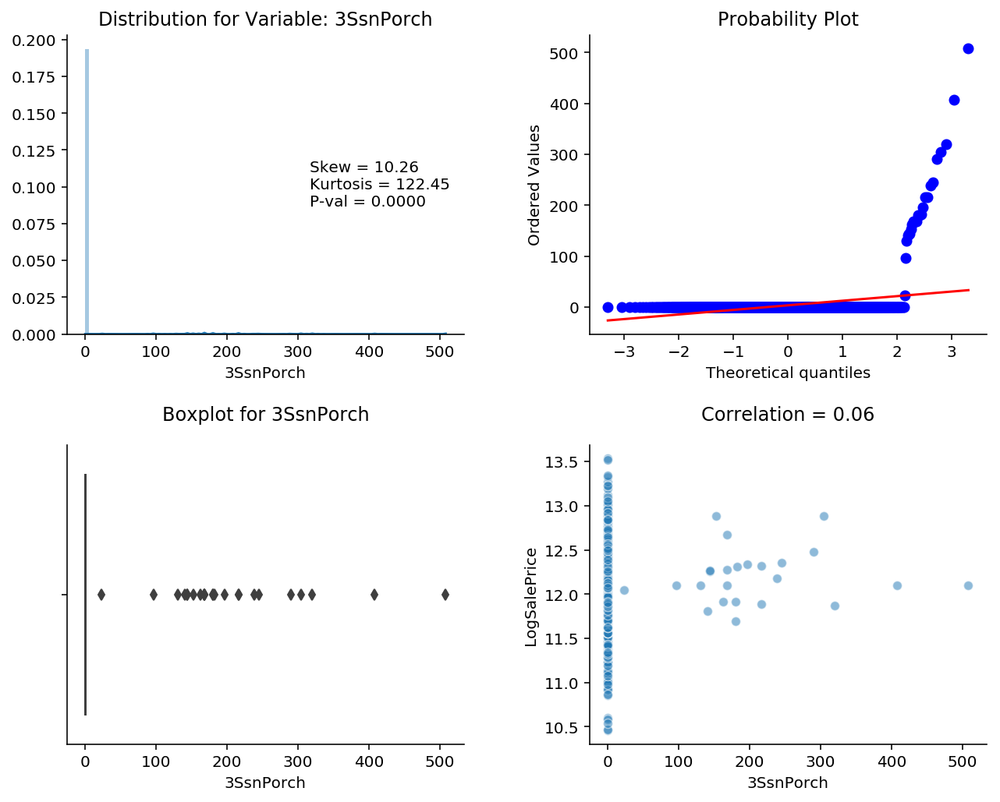

In [82]:
var_plots(df['3SsnPorch'])

In [83]:
# Dropping the variable as most values are 0
df = df.drop('3SsnPorch', axis=1)

#### Feature : ScreenPorch

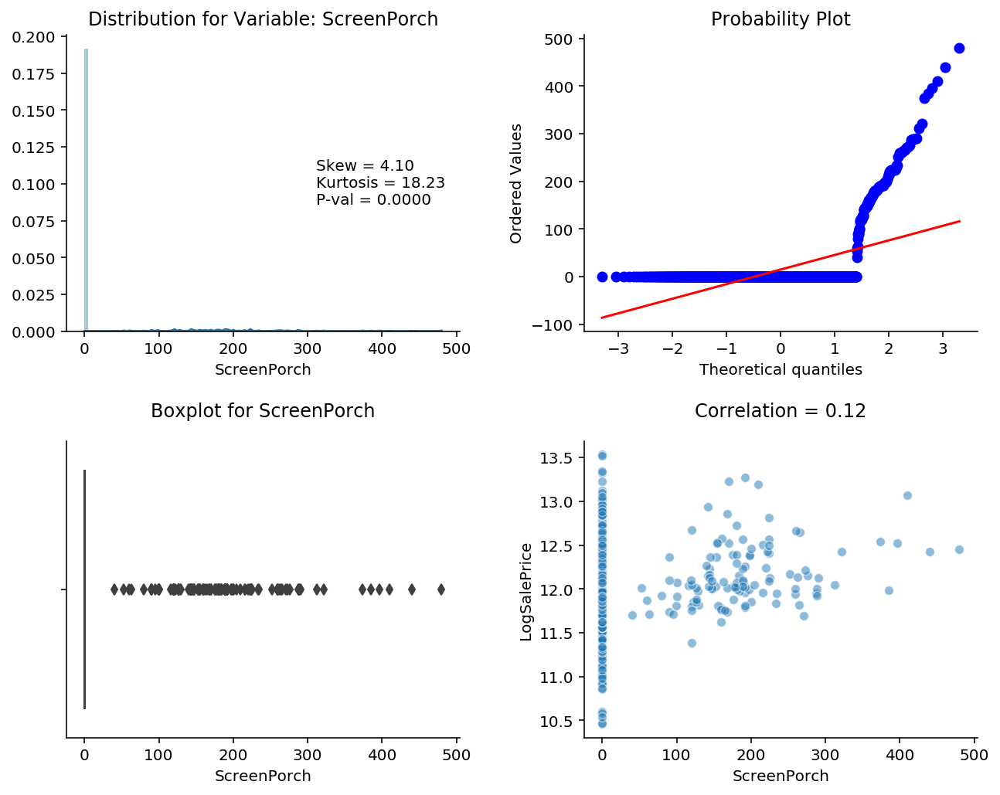

In [84]:
var_plots(df.ScreenPorch)

In [85]:
# Dropping the variable as most values are 0
df = df.drop('ScreenPorch', axis=1)

### Analysing Categorical Variables

In [86]:
# Function to display labels on plots
def show_values_on_bars(axs):
    def _show_on_single_plot(ax):        
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()
            value = '{:.0f}'.format(p.get_height())
            ax.text(_x, _y, value, ha="center") 

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

In [87]:
def categorical_var_plots(series, fig_size=(10,5), rotate=False, rotate_angle=30):
    '''
    Function that provides a countplot to see the distribution of the different categories for each variable.
    Also plots the catplot against LogSalePrice.
    '''
    f, (ax1, ax2) = plt.subplots(1,2,figsize=fig_size)
    f.tight_layout(pad=5.0)
    
    count_plt = sns.countplot(series, palette='pastel', ax=ax1)
    ax1.set_title('Occurences of Each Category', size=14, y=1.05)
    show_values_on_bars(ax1)
    
    box_plt = sns.boxplot(x=series.name, y='LogSalePrice', data=df, palette='pastel', ax=ax2)
    ax2.set_title('Categorical Plot of against Logged Prices', size=14, y=1.05)
    
    if rotate:
        count_plt.set_xticklabels(count_plt.get_xticklabels(), rotation=rotate_angle, fontsize=12)
        box_plt.set_xticklabels(box_plt.get_xticklabels(), rotation=rotate_angle, fontsize=12)
    
    sns.despine();

#### Feature: MSSubClass - Identifies the type of dwelling involved in the sale.

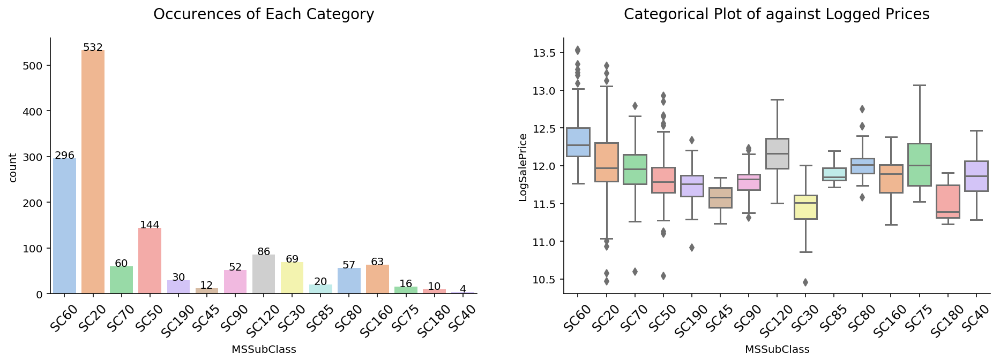

In [88]:
categorical_var_plots(df.MSSubClass, fig_size=(14,5), rotate=True, rotate_angle=45)

#### Feature: MSZoning - The general zoning classification

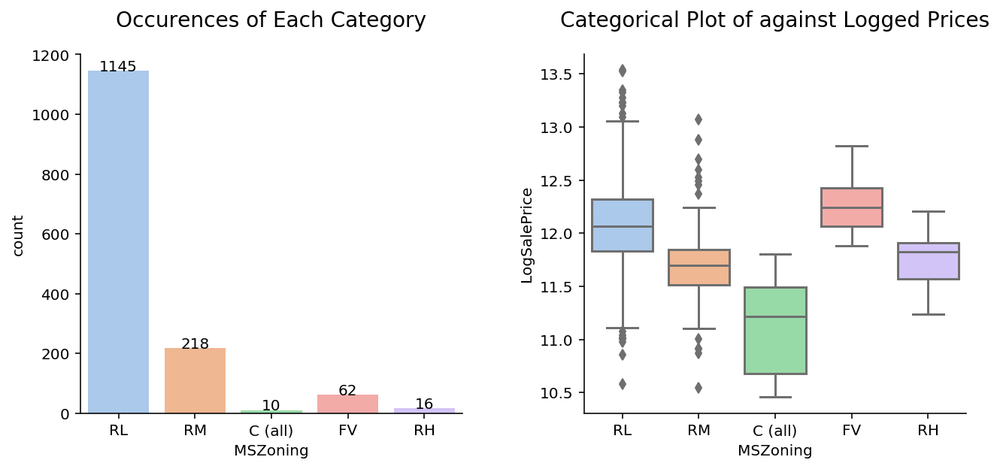

In [89]:
categorical_var_plots(df.MSZoning)

#### Feature: Street - Type of road access.

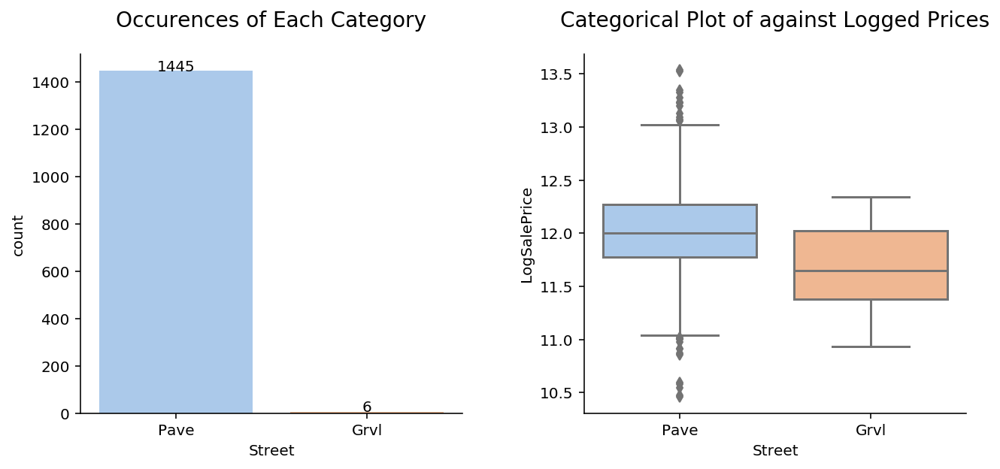

In [90]:
categorical_var_plots(df.Street)

Since the distribution of the different classes are so imbalanced, this feature does not add much information to the analysis and will be removed.

In [91]:
df = df.drop('Street', axis=1)

#### Feature: LotShape - General Shape of the Propety.

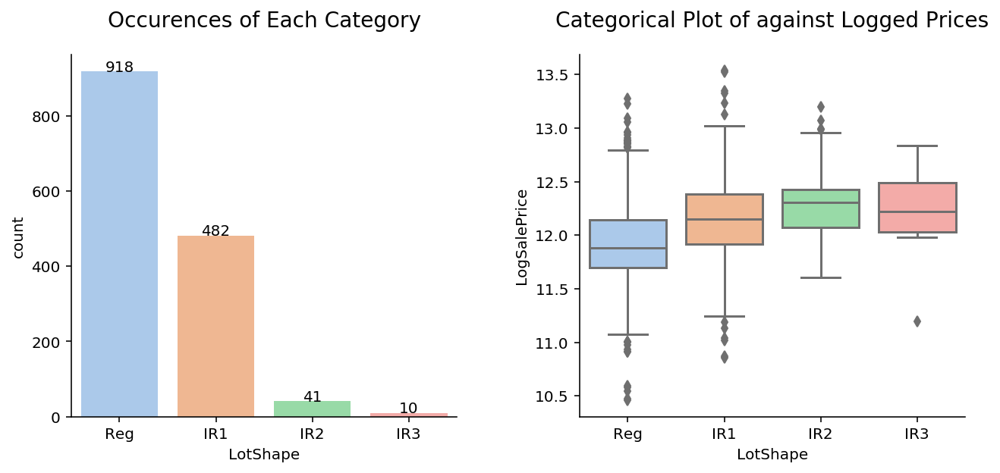

In [92]:
categorical_var_plots(df.LotShape)

Given the small occurences of moderate to highly irregular lot shapes and their similar distribution to those of slightly irregular shape, we will condense this variable into a binary class.  

In [93]:
df.LotShape = df.LotShape.apply(lambda x:
                                0 if x == 'Reg'
                                else 1)

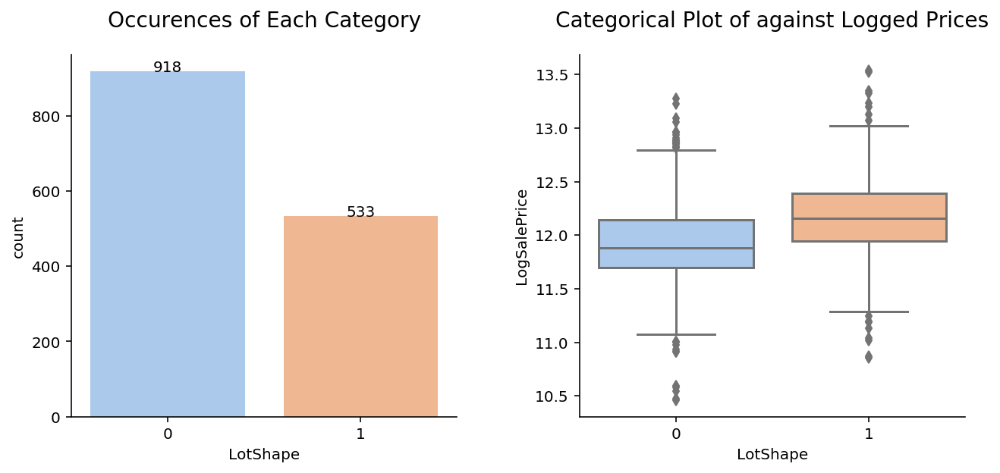

In [94]:
categorical_var_plots(df.LotShape)

#### Feature: LandContour - Flatness of the property.

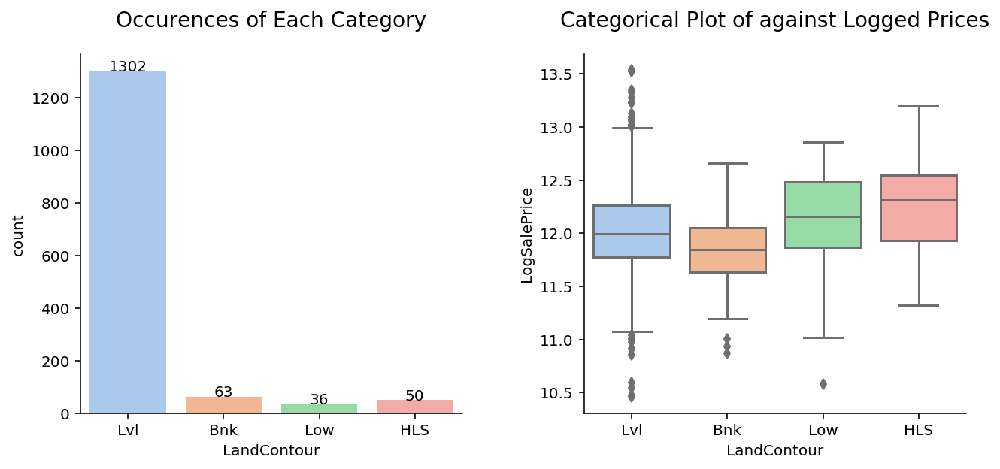

In [95]:
categorical_var_plots(df.LandContour)

#### Feature: LandSlope - Slope of the property

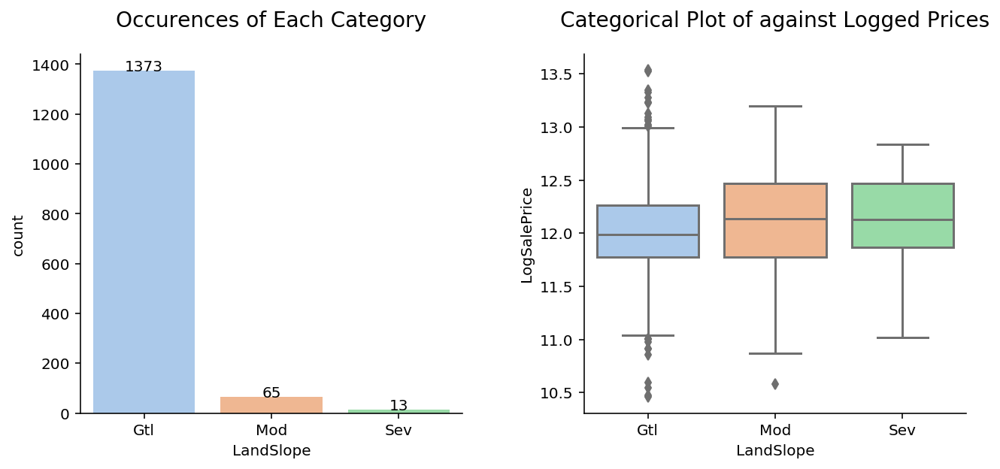

In [96]:
categorical_var_plots(df.LandSlope)

Given that Moderate and Severe slopes have similar distribution, we will be binarising this variable.

In [97]:
df.LandSlope = df.LandSlope.apply(lambda x:
                                  0 if x == 'Gtl'
                                  else 1)

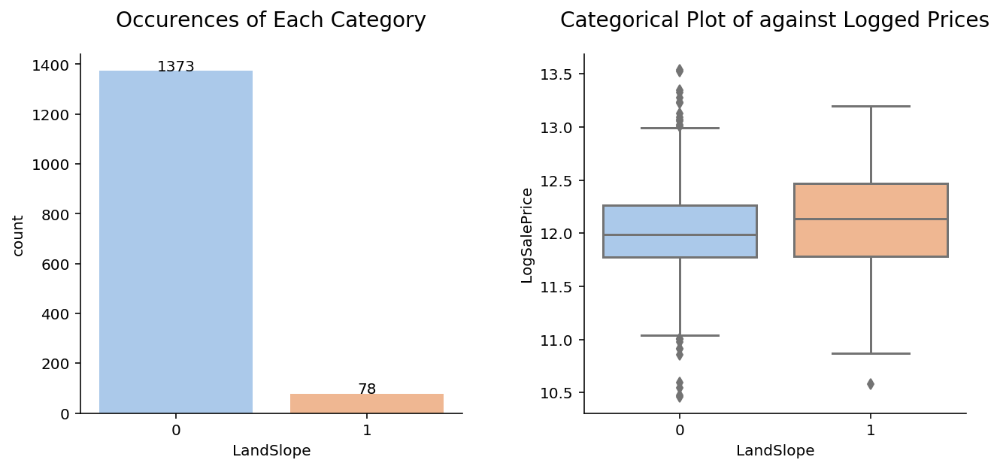

In [98]:
categorical_var_plots(df.LandSlope)

#### Feature: LotConfig

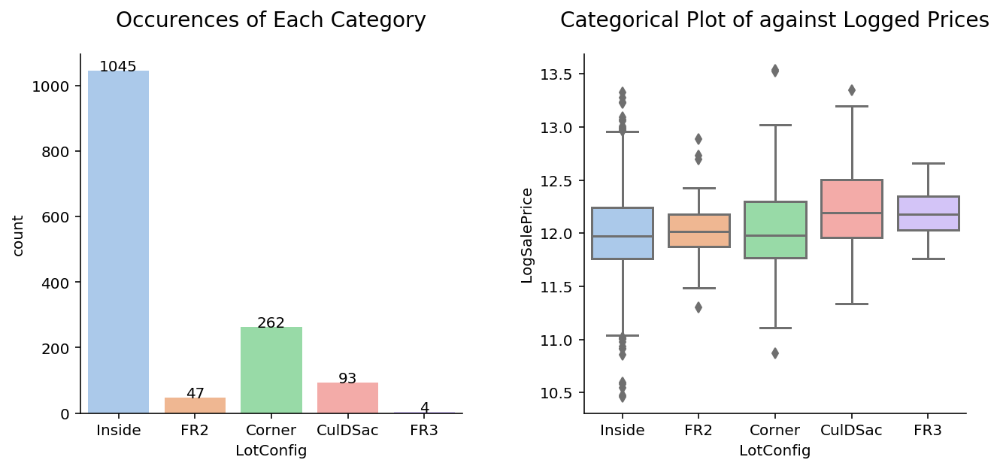

In [99]:
categorical_var_plots(df.LotConfig)

Merging the categories FR2 and FR3 as they are similar.

In [100]:
df.LotConfig = df.LotConfig.apply(lambda x:
                                  'Frontage' if x == 'FR2'
                                  else 'Frontage' if x == 'FR3'
                                  else x)

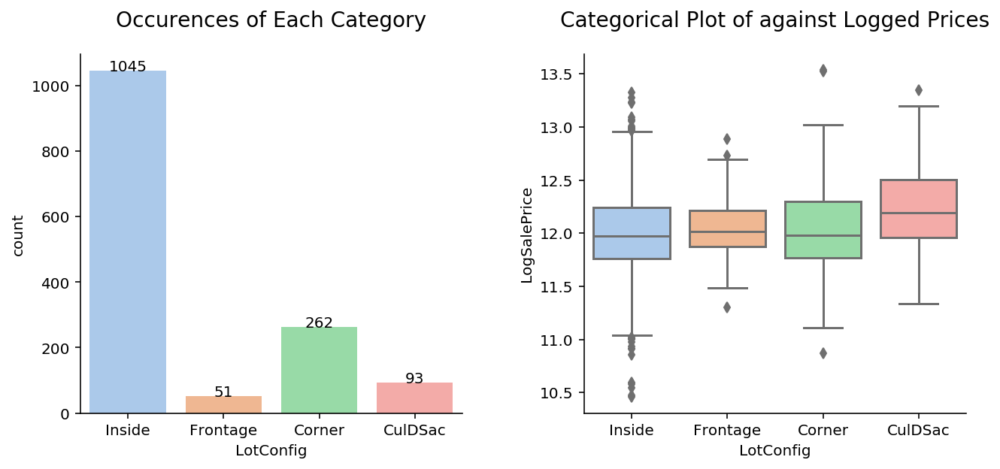

In [101]:
categorical_var_plots(df.LotConfig)

#### Feature: Utilities

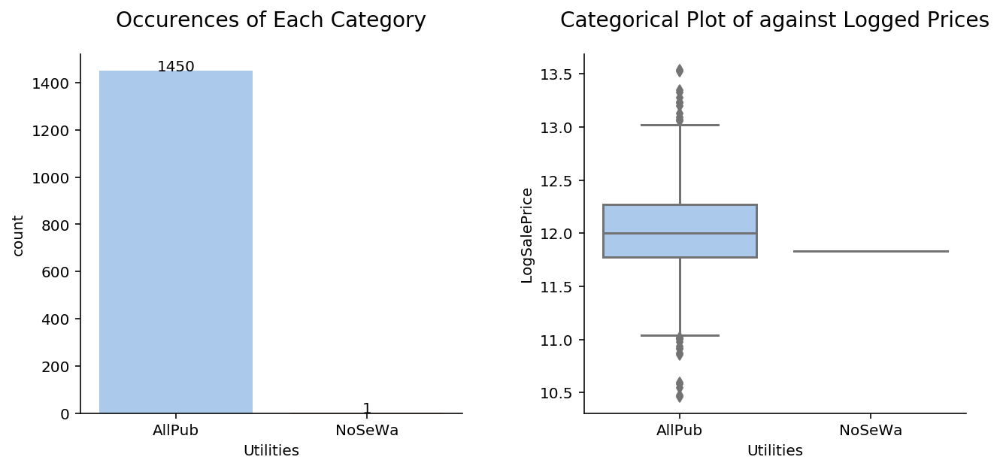

In [102]:
categorical_var_plots(df.Utilities)

Dropping the variable as all but one observation is in a different category.

In [103]:
df = df.drop('Utilities', axis=1)

#### Feature: Neighbourhood - Physical location within Ames city limits

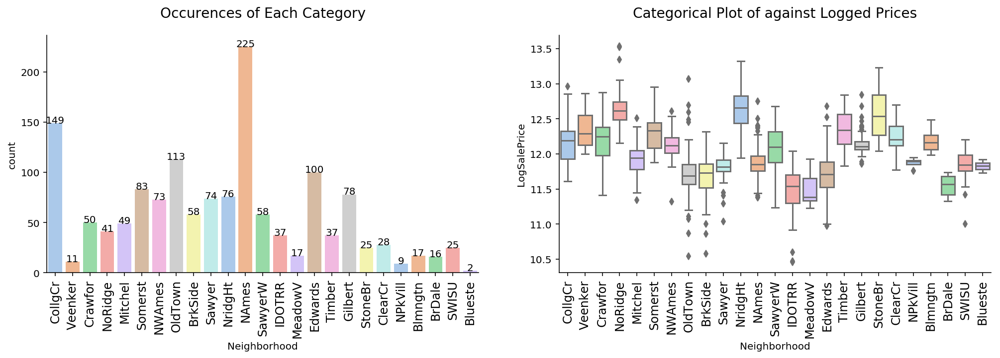

In [104]:
categorical_var_plots(df.Neighborhood, fig_size=(15,5), rotate=True, rotate_angle=90)

#### Feature: Condition1: Proximity to main road or railroad.

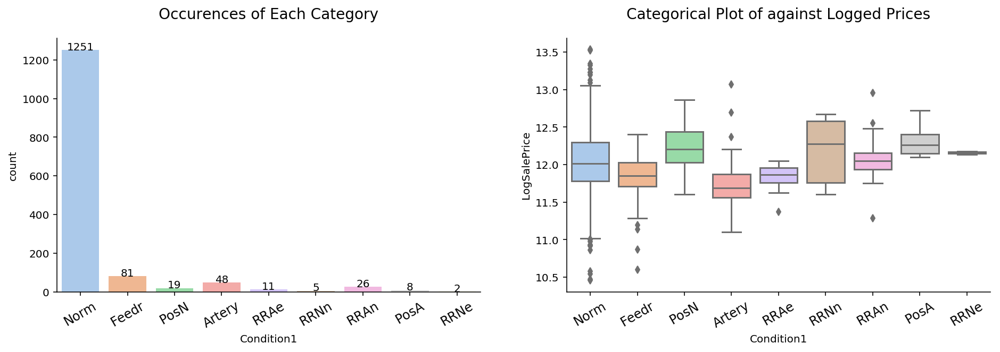

In [105]:
categorical_var_plots(df.Condition1, fig_size=(14,5), rotate=True, rotate_angle=30)

In [106]:
# Simplifying the categoreies
df.Condition1 = df.Condition1.apply(lambda x:
                                    x if x == 'Norm'
                                    else 'MainRoad' if x == 'Feedr'
                                    else 'MainRoad' if x == 'Artery'
                                    else 'MainRoad' if x == 'PosN'
                                    else 'MainRoad' if x == 'PosA'
                                    else 'RailRoad')

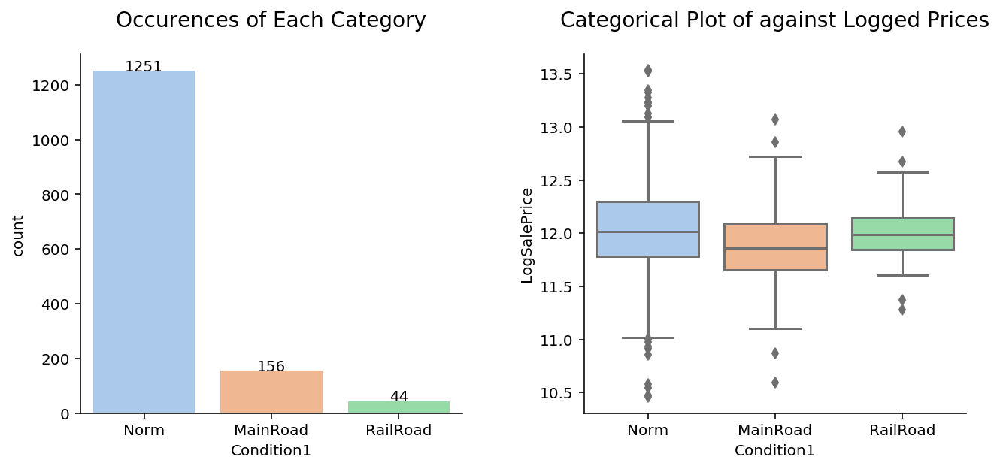

In [107]:
categorical_var_plots(df.Condition1)

#### Feature: Condition2: Proximity to main road or railroad (if more than 1 is present).

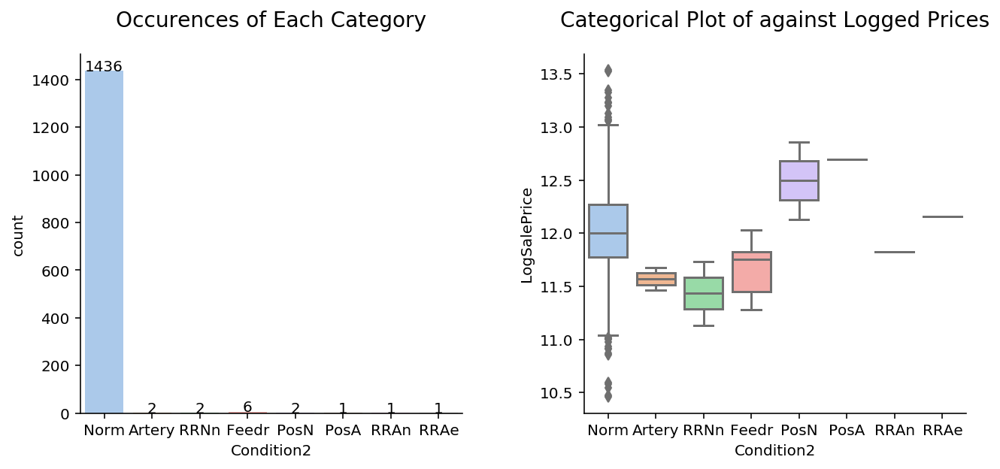

In [108]:
categorical_var_plots(df.Condition2)

In [109]:
# Dropping the variable as too few occurences in other classes.
df = df.drop('Condition2', axis=1)

#### Feature: BldgType - Type of dwelling

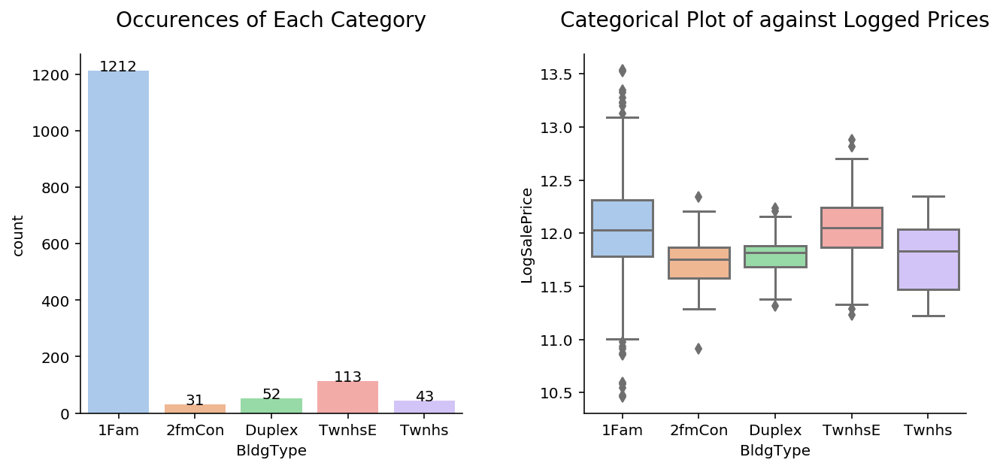

In [110]:
categorical_var_plots(df.BldgType)

#### Feature: HouseStyle

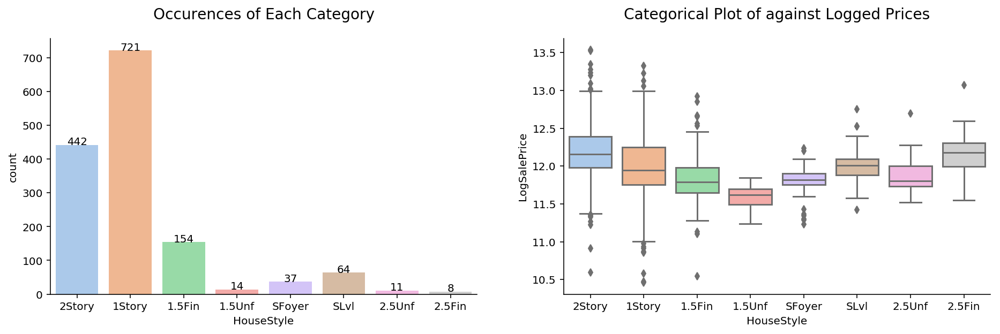

In [111]:
categorical_var_plots(df.HouseStyle, fig_size=(14,5))

#### Feature: RoofStyle

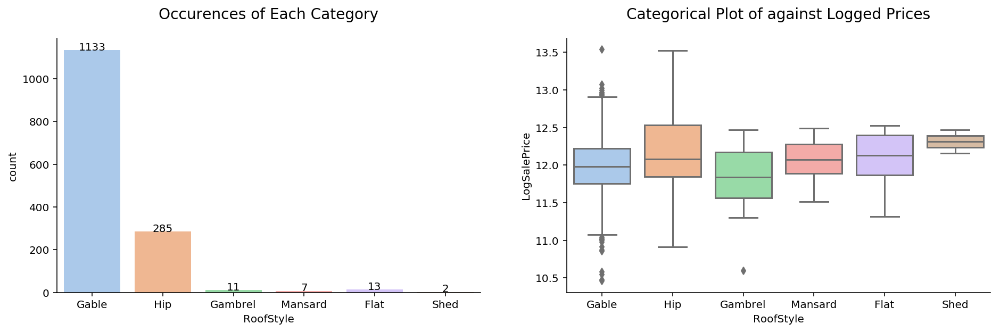

In [112]:
categorical_var_plots(df.RoofStyle, fig_size=(14,5))

Since the distribution of the categories other than Hip are similar to Gable and their occurences are low, we will simplify the variable.

In [113]:
df.RoofStyle = df.RoofStyle.apply(lambda x:
                                  1 if x == 'Hip'
                                  else 0)

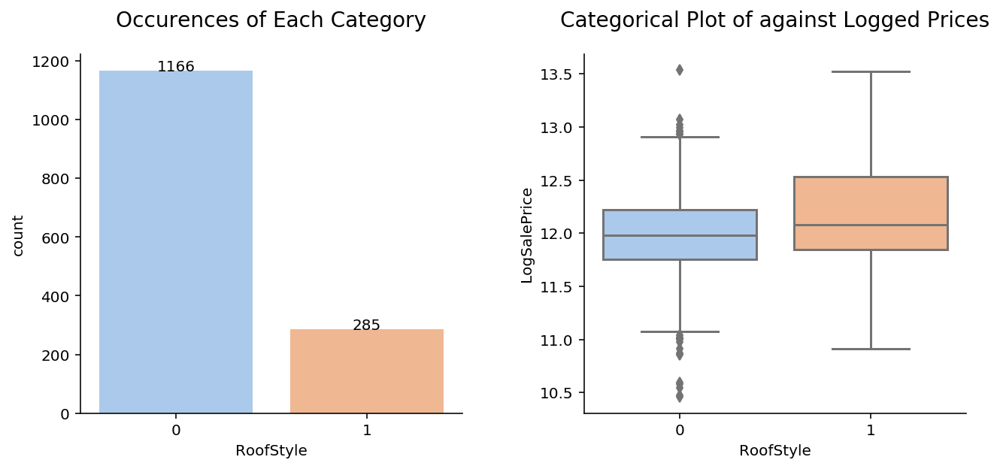

In [114]:
categorical_var_plots(df.RoofStyle)

#### Feature: RoofMatl

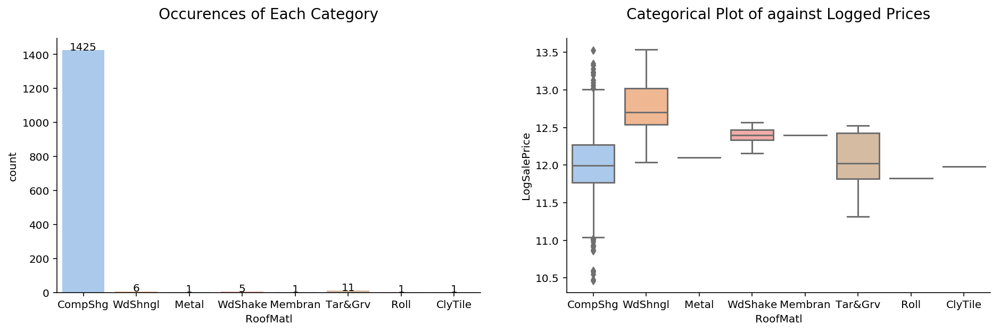

In [115]:
categorical_var_plots(df.RoofMatl, fig_size=(14,5))

In [116]:
# Dropping the variable as the occurences in the other classes are too low.
df = df.drop('RoofMatl', axis=1)

#### Feature: Exterior1st - Exterior covering the house.

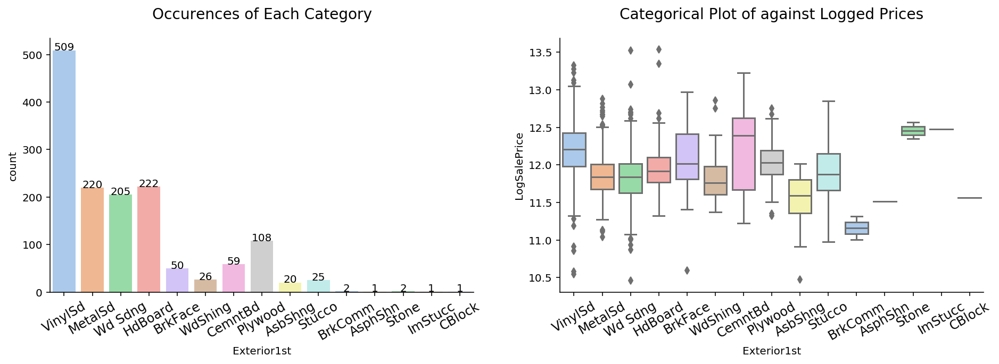

In [117]:
categorical_var_plots(df.Exterior1st, fig_size=(14,5), rotate=True, rotate_angle=30)

In [118]:
# Reducing the number of categories
df.Exterior1st = df.Exterior1st.apply(lambda x:
                                      'Other' if x == 'BrkComm'
                                      else 'Other' if x == 'AsphShn'
                                      else 'Other' if x == 'Stone'
                                      else 'Other' if x == 'ImStucc'
                                      else 'Other' if x == 'CBlock'
                                      else x)

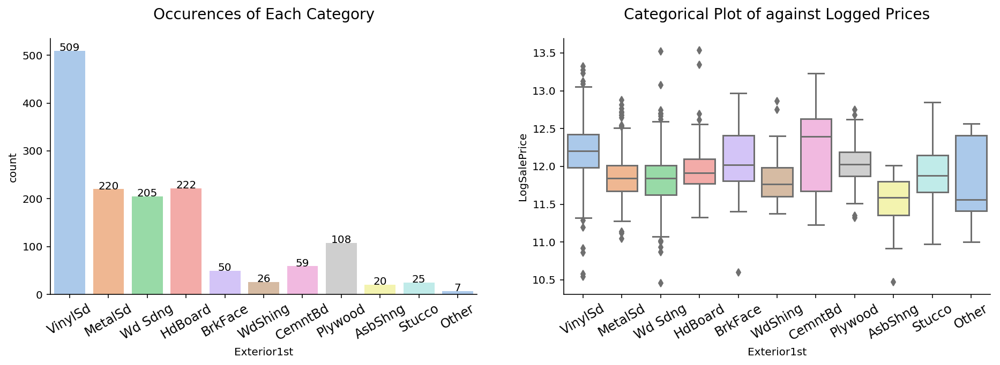

In [119]:
categorical_var_plots(df.Exterior1st, fig_size=(14,5), rotate=True, rotate_angle=30)

#### Feature: Exterior2nd

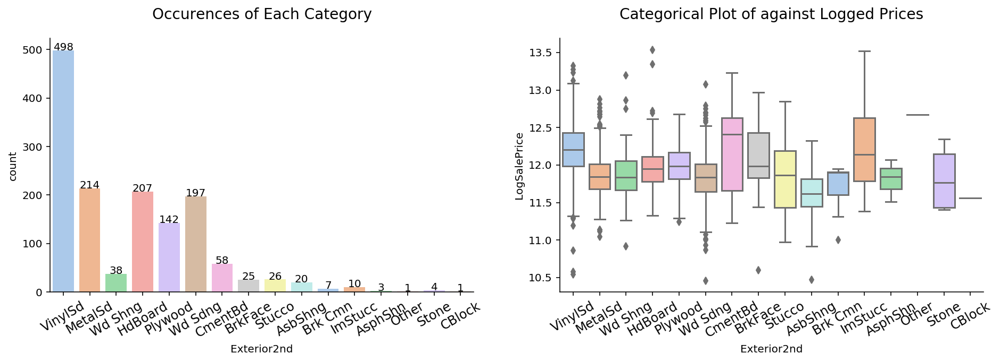

In [120]:
categorical_var_plots(df.Exterior2nd, fig_size=(14,5), rotate=True, rotate_angle=30)

In [121]:
# Reducing the number of categories
df.Exterior2nd = df.Exterior2nd.apply(lambda x:
                                      'Other' if x == 'BrkComm'
                                      else 'Other' if x == 'AsphShn'
                                      else 'Other' if x == 'Stone'
                                      else 'Other' if x == 'ImStucc'
                                      else 'Other' if x == 'CBlock'
                                      else x)

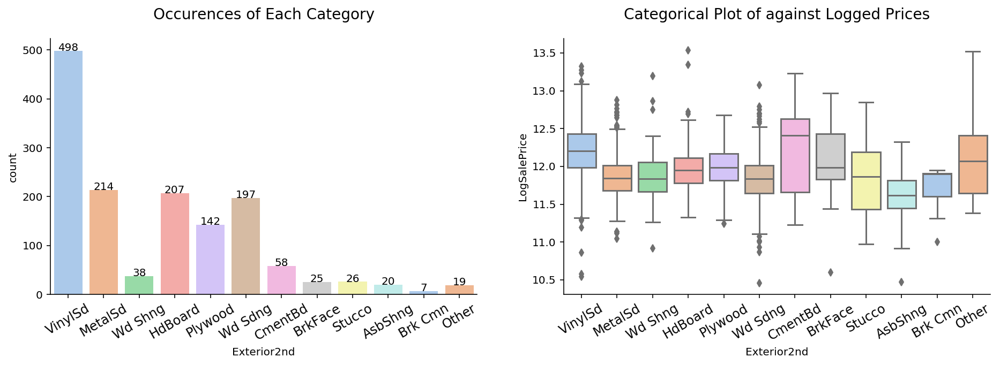

In [122]:
categorical_var_plots(df.Exterior2nd, fig_size=(14,5), rotate=True, rotate_angle=30)

#### Feature: MasVnrType

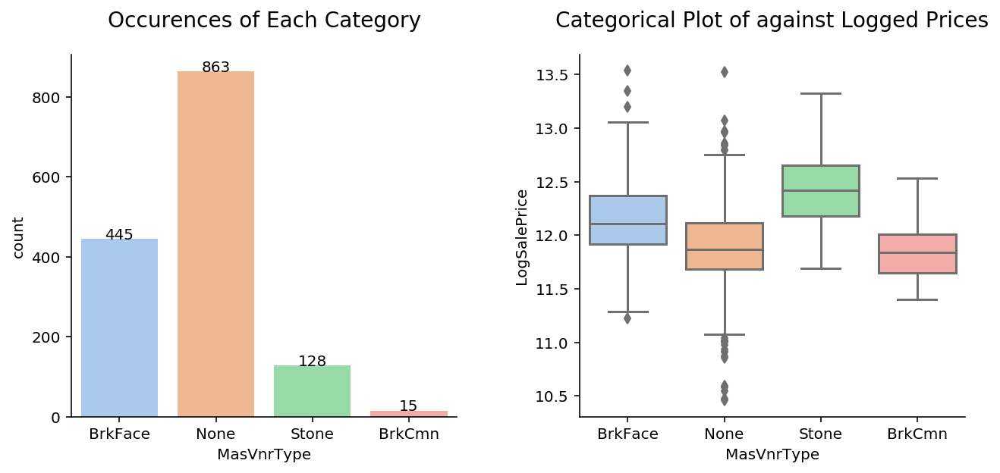

In [123]:
categorical_var_plots(df.MasVnrType)

#### Feature: Foundation

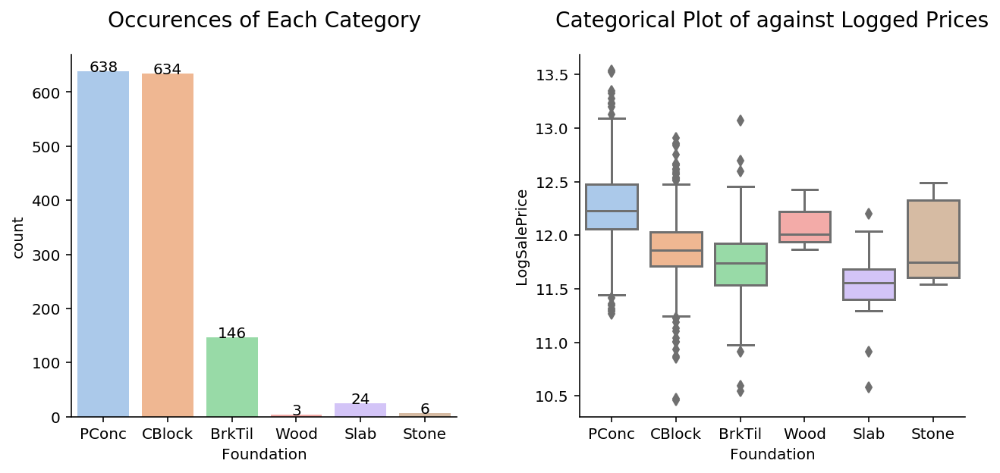

In [124]:
categorical_var_plots(df.Foundation)

In [156]:
df.Foundation = df.Foundation.apply(lambda x:
                                    'Other' if x == 'Wood'
                                    else 'Other' if x == 'Slab'
                                    else 'Other' if x == 'Stone'
                                    else x)

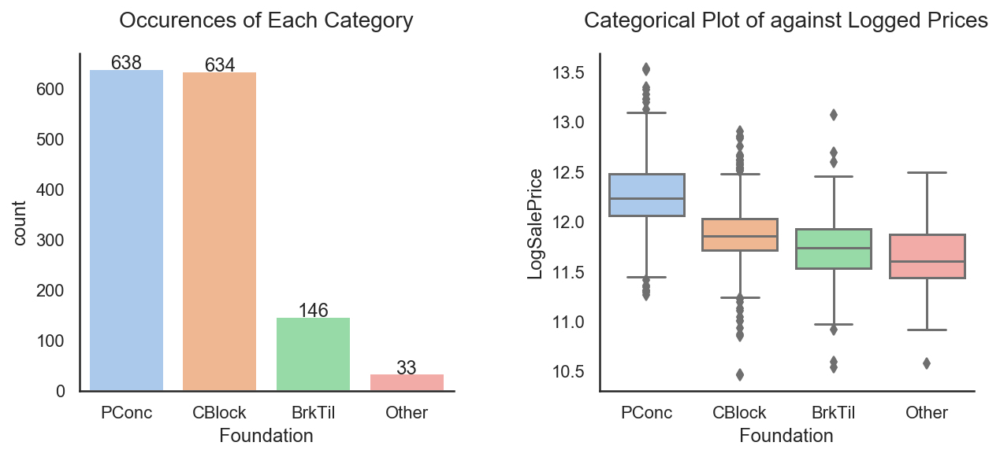

In [157]:
categorical_var_plots(df.Foundation)

#### Feature: BsmtFinType1

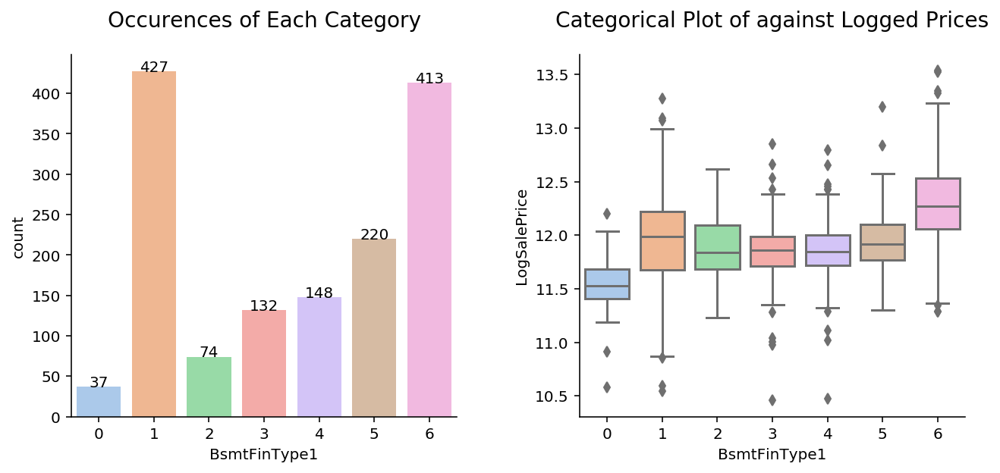

In [125]:
categorical_var_plots(df.BsmtFinType1)

#### Feature: BsmtFinType2

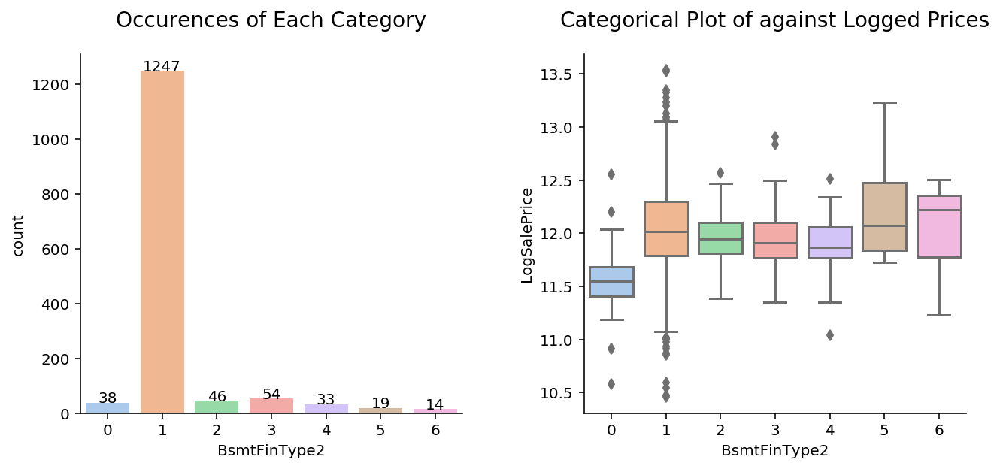

In [126]:
categorical_var_plots(df.BsmtFinType2)

#### Feature: Heating

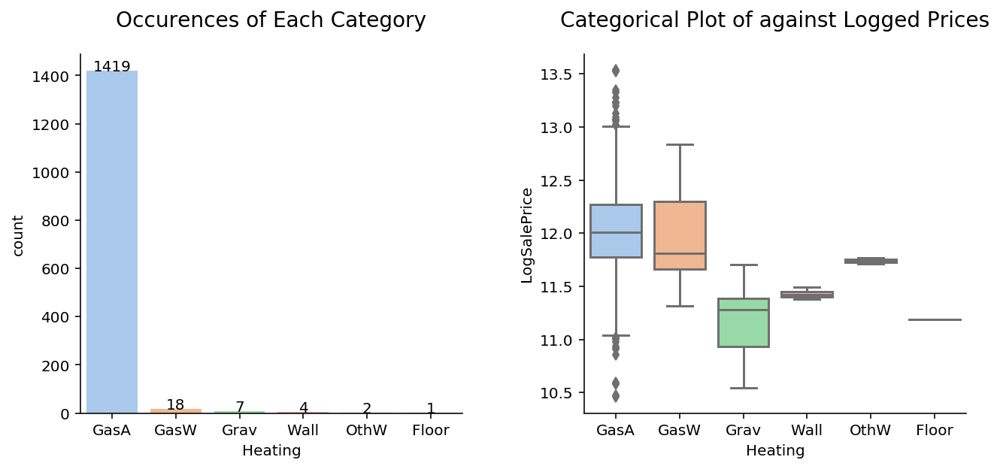

In [127]:
categorical_var_plots(df.Heating)

Dropping the variable as there is not much observations for the other categories.

In [128]:
df = df.drop('Heating', axis=1)

#### Feature: CentralAir

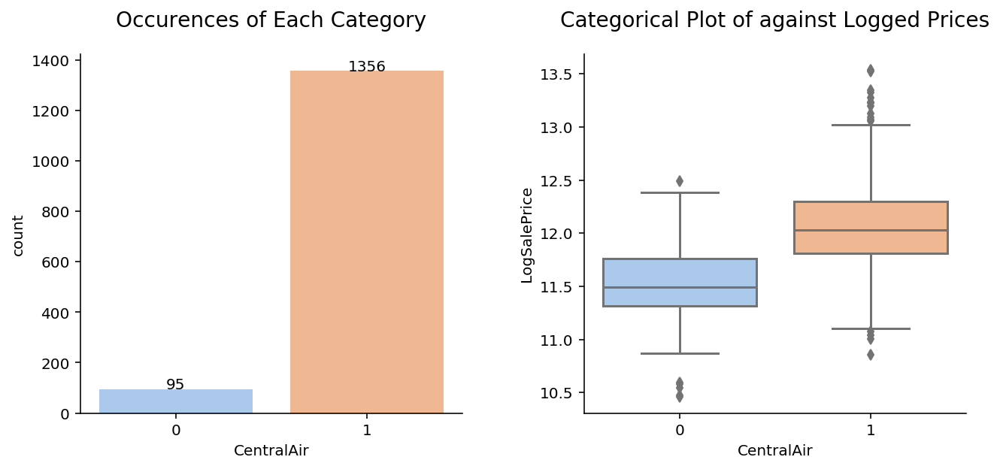

In [129]:
categorical_var_plots(df.CentralAir)

#### Feature: GarageType

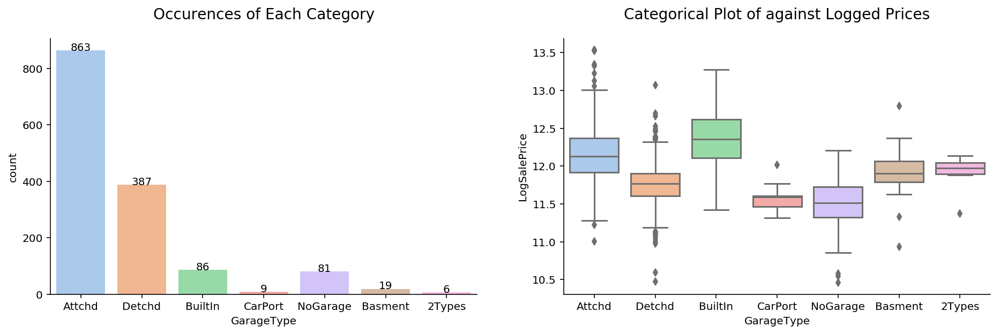

In [130]:
categorical_var_plots(df.GarageType, fig_size=(14,5))

In [131]:
# Simplifying the categories
df.GarageType = df.GarageType.apply(lambda x:
                                    'Other' if x == 'CarPort'
                                    else 'Other' if x == 'Basment'
                                    else 'Other' if x == '2Types'
                                    else x)

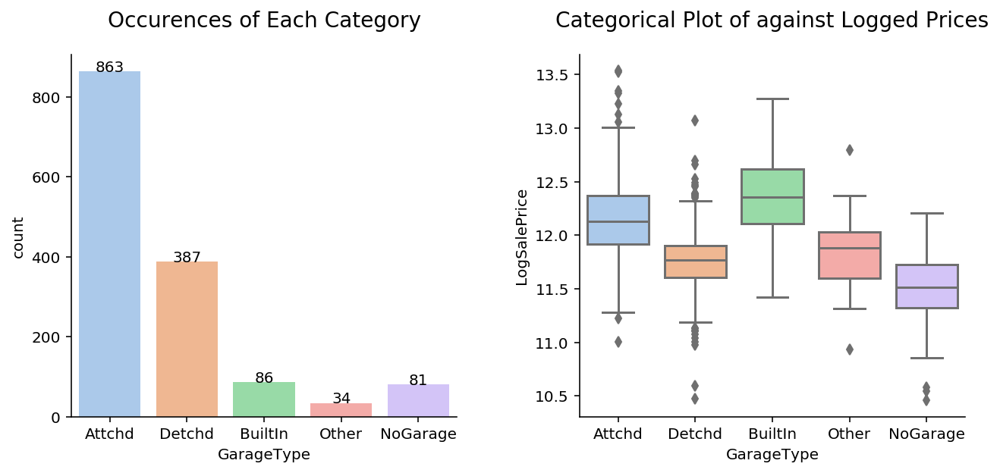

In [132]:
categorical_var_plots(df.GarageType)

#### Feature: Electrical

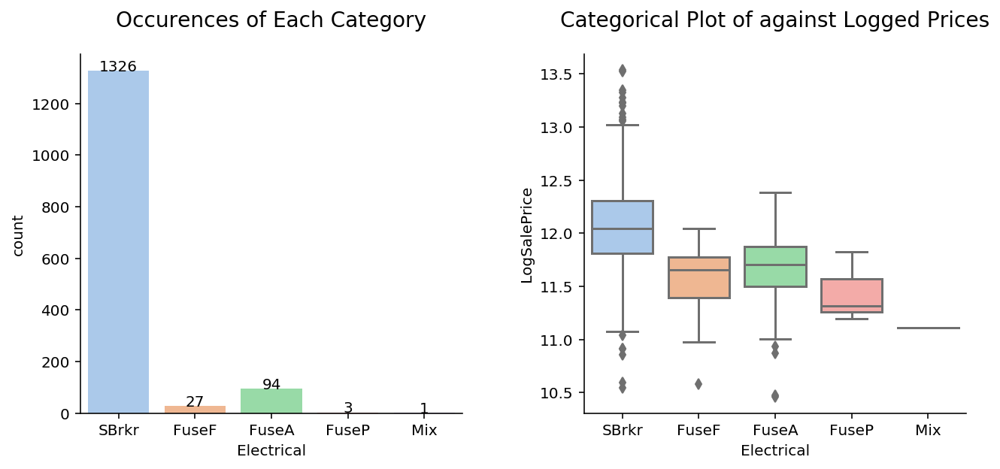

In [133]:
categorical_var_plots(df.Electrical)

In [134]:
# Simplifying the catgoeries as the other categories ahve similar distribution
df.Electrical = df.Electrical.apply(lambda x:
                                    1 if x == 'SBrkr'
                                    else 0)

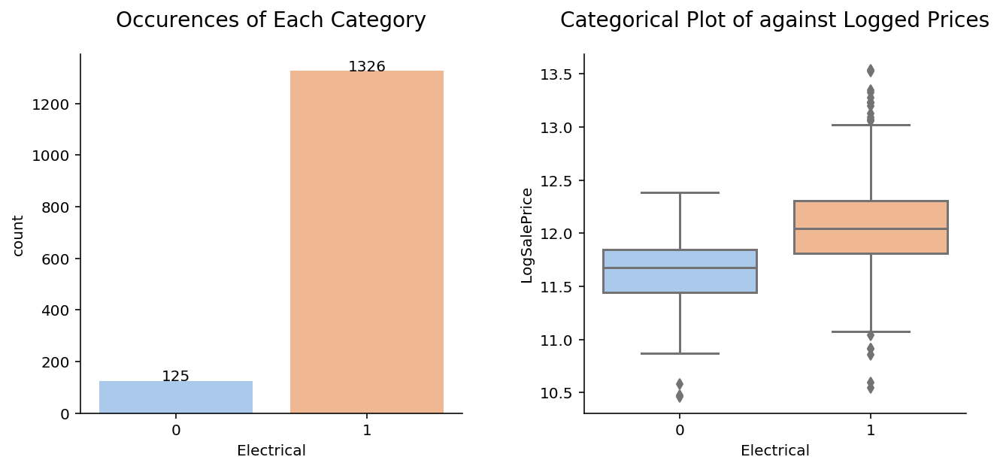

In [135]:
categorical_var_plots(df.Electrical)

#### Feature: Functional

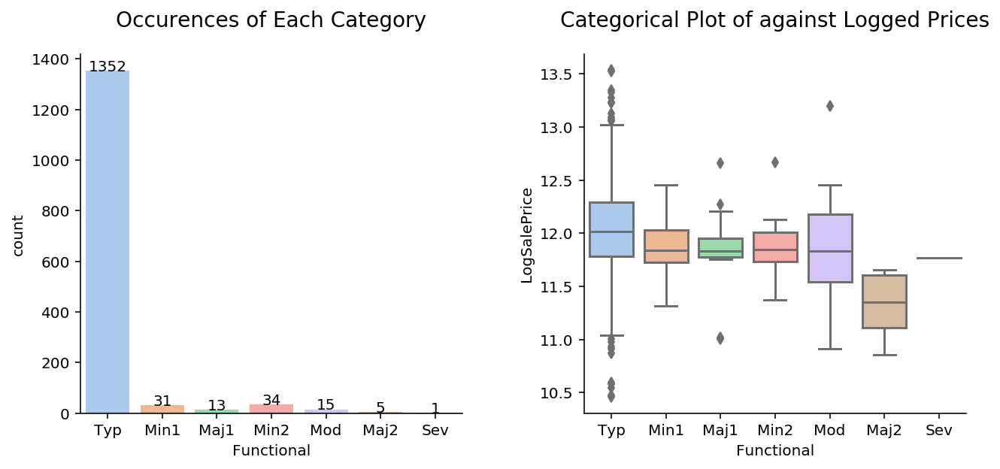

In [136]:
categorical_var_plots(df.Functional)

In [137]:
# Simplifying the categories
df.Functional = df.Functional.apply(lambda x:
                                    1 if x == 'Typ'
                                    else 0)

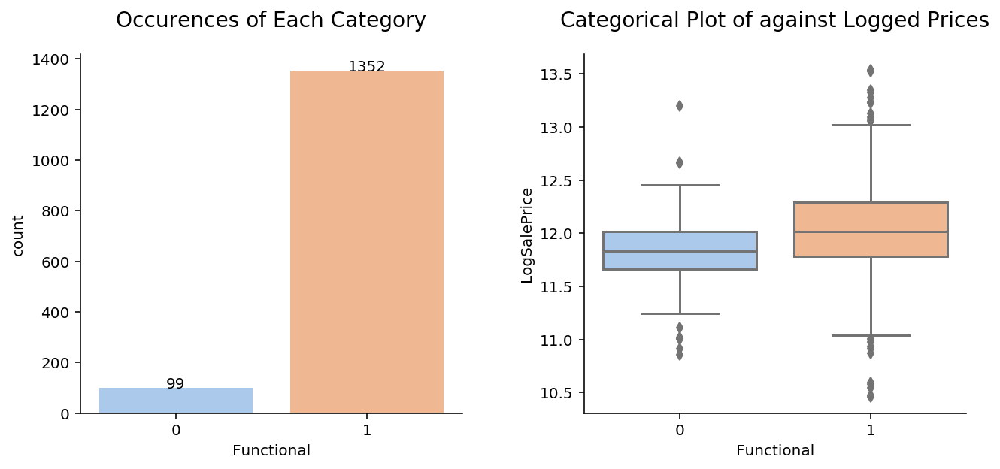

In [138]:
categorical_var_plots(df.Functional)

#### Feature: Fence

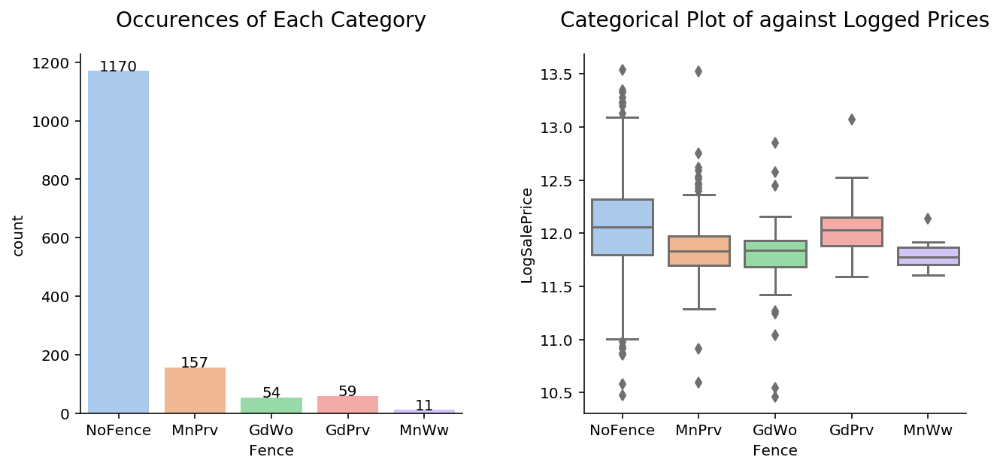

In [139]:
categorical_var_plots(df.Fence)

#### Feature: MoSold - Month Sold

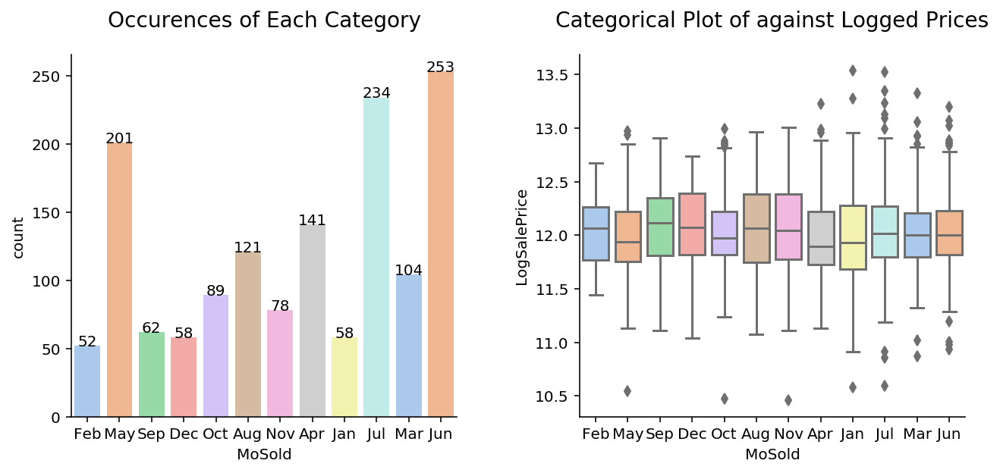

In [140]:
categorical_var_plots(df.MoSold)

#### Feature: SaleType

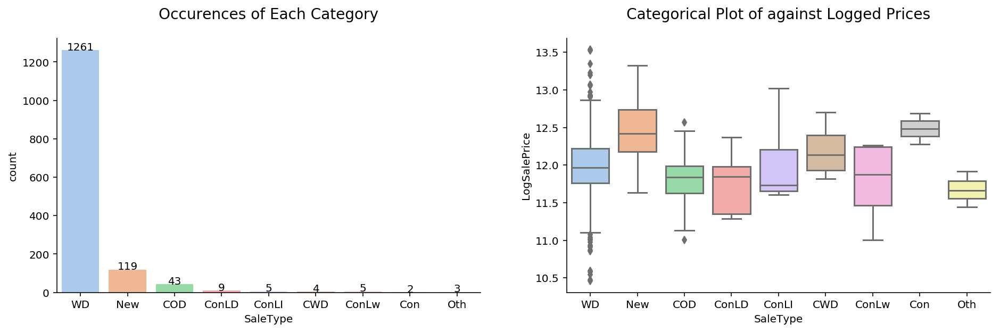

In [141]:
categorical_var_plots(df.SaleType, fig_size=(14,5))

In [142]:
# Merging similar categories
df.SaleType = df.SaleType.apply(lambda x :
                                x if x == 'WD'
                                else 'WD' if x == 'CWD'
                                else 'WD' if x == 'VWD'
                                else 'New' if x == 'New'
                                else 'COD' if x == 'COD'
                                else 'Other')

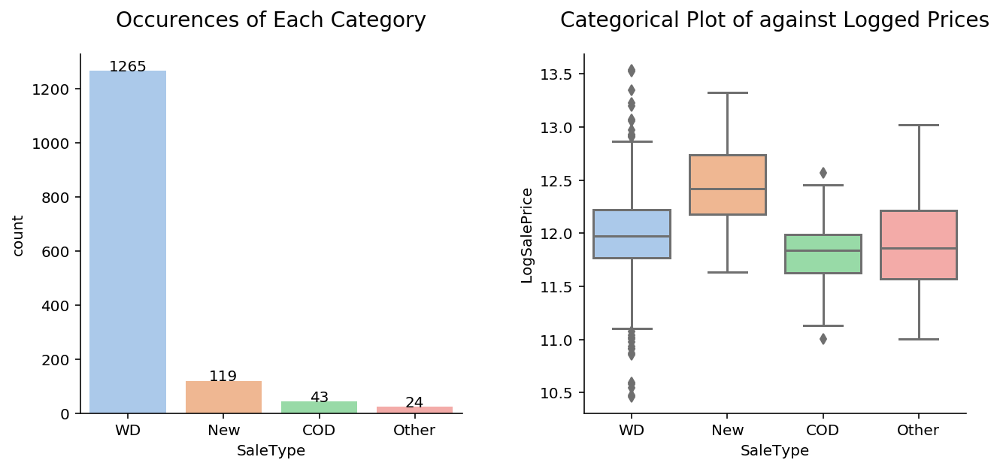

In [143]:
categorical_var_plots(df.SaleType)

#### Feature: SaleCondition

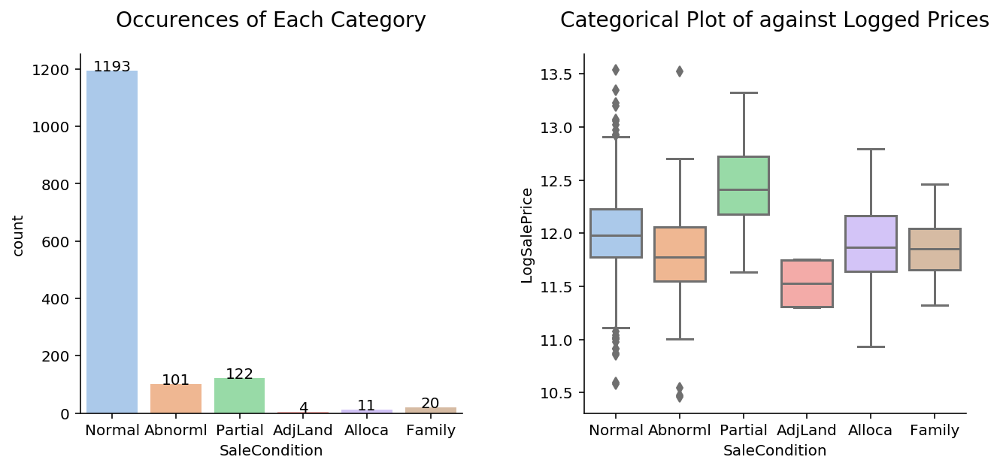

In [144]:
categorical_var_plots(df.SaleCondition)

In [145]:
# Merging the lower frequency categories
df.SaleCondition = df.SaleCondition.apply(lambda x:
                                          'Other' if x == 'AdjLand'
                                          else 'Other' if x == 'Alloca'
                                          else 'Other' if x == 'Family'
                                          else x)

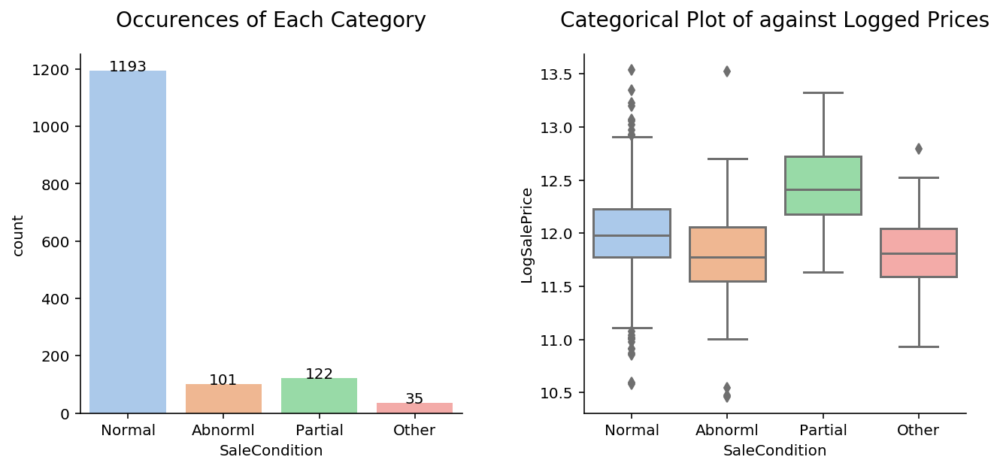

In [146]:
categorical_var_plots(df.SaleCondition)

### Checking For Multicollinearity

In [147]:
# Rearranging our dataset
df_arranged = df.drop('LogSalePrice', axis=1)
df_arranged['LogSalePrice'] = df.LogSalePrice
df = df_arranged
del df_arranged

(45.5, -0.5)

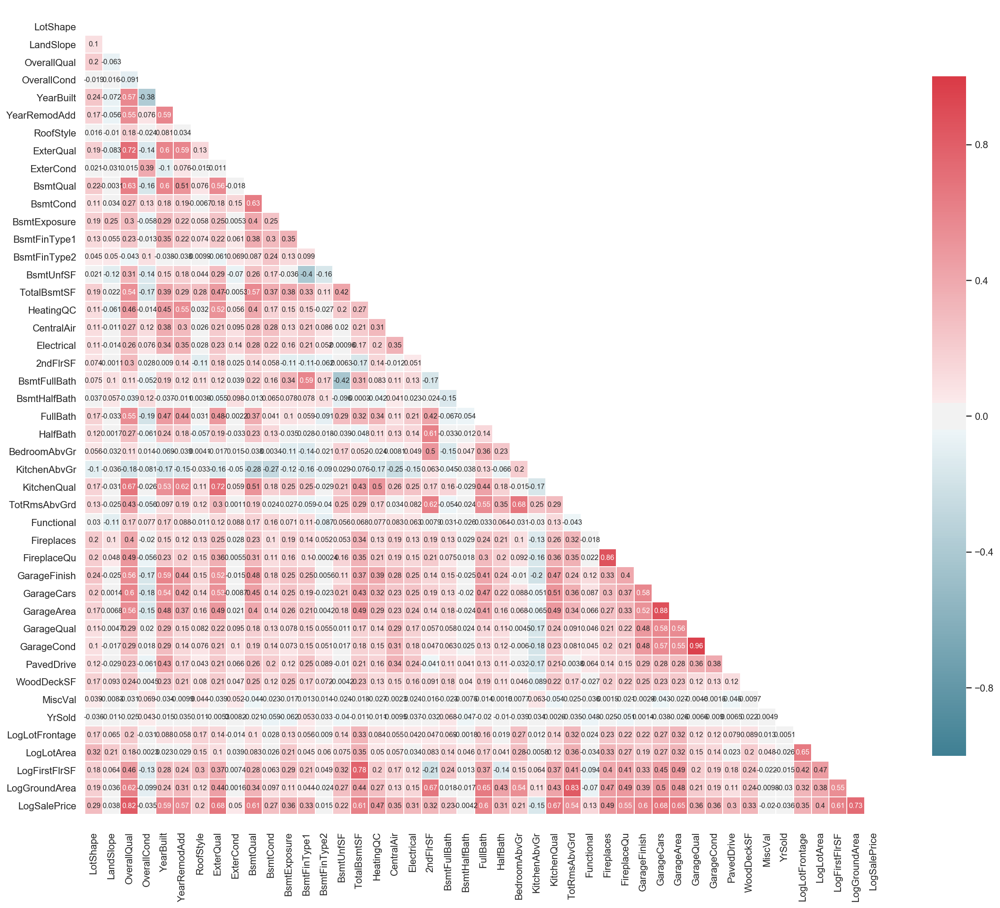

In [148]:
sns.set(style="white")

# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1.0, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .7}, annot=True, annot_kws={"size": 8})

bottom, top = ax.get_ylim()
heatmap.set_ylim(bottom + 0.5, top - 0.5)

From the heatmap above, we identified 3 pairs of variables that are highly correlated with one another. We decided to keep the variable with the higher correlation to the target and drop the other one.
* Fireplaces and FireplaceQu
* GarageArea and GarageCars
* GarageCond and GarageQual

In [149]:
df = df.drop(['Fireplaces', 'GarageArea', 'GarageCond'], axis=1)

### Finished Cleaning, Saving our Cleaned Dataset

In [150]:
with open('cleaned_dataset.pickle', 'wb') as f:
    pickle.dump(df, f)